# Project - Kraftwerk

## Master Thesis

Clemens Wöhrer

# Teufelmühle - hourly Prediction

---

# Install and Load Packages

In [1]:
!pip install --upgrade pip
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install statsmodels
!pip install sklearn
!pip install plotly
!pip install pmdarima
!pip install ipylab

In [1]:
%run functions.ipynb

In [2]:
np.random.seed(1234)
tf.random.set_seed(1234)

---

# Load Data

In [3]:
#Load folders
#lpd = Path("../Data/Lastprofildaten")
#wasser = Path("../Data/Wasserdaten")
#wetter = Path("../Data/Wetterdaten")
output = Path("../Data/Outputdaten")
forecast = Path("../Data/Forecast")

#Load csv names 
#mm_data = get_files(lpd, 'Lastprofil_Magerlmühle_*.csv')
#ps_data = get_files(lpd, 'Lastprofil_Pürnstein_*.csv')
#tm_data = get_files(lpd, 'Lastprofil_Teufelmühle_*.csv')
#wetter_files = get_files(wetter, '*.csv')
#wasser_files = get_files(wasser, '*.csv')

#Load dataframes from pickle
#mm_all = pd.read_pickle(os.path.join(output, "mm_all.pkl"))
#pm_all = pd.read_pickle(os.path.join(output, "pm_all.pkl"))
#tm_all = pd.read_pickle(os.path.join(output, "tm_all.pkl"))

In [4]:
data = pd.read_pickle(os.path.join(output, "pm_all.pkl"))

In [5]:
# Selecting Data greater than date 2019-03-01
data = data[data['timestamp'] >= '2019-03-01 00:00:00']

In [6]:
data.head()

,timestamp,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,...,Diffuse_Shortwave_Radiation,Mean_Sea_Level_Pressure,Evapotranspiration,FAO_Reference_Evapotranspiration,Temperature,Soil_Temperature,Soil_Moisture,Vapor_Pressure_Deficit,waterlevel,watertemperature
10176,2019-03-01 00:00:00,0.0,8.650782,0.0,0.0,0.0,85.0,28.822490,279.34467,44.280000,...,0.0,1014.0,0.00720,0.023909,7.76,7.260010,0.287,1.650190,158.425,4.200
10177,2019-03-01 01:00:00,0.0,7.560782,0.0,0.0,0.0,89.0,29.091030,282.14430,43.199997,...,0.0,1014.1,0.00720,0.015030,5.97,6.899994,0.287,1.123480,158.725,4.125
10178,2019-03-01 02:00:00,0.0,6.960782,0.0,0.0,0.0,90.0,28.387545,282.45000,39.239998,...,0.0,1014.4,0.00144,0.012358,5.36,6.410004,0.288,0.980140,159.075,4.025
10179,2019-03-01 03:00:00,0.0,6.400782,0.0,0.0,0.0,88.0,29.871325,282.52880,40.680000,...,0.0,1014.3,0.00288,0.016309,4.87,5.959992,0.288,1.131616,159.450,3.925
10180,2019-03-01 04:00:00,0.0,6.080782,0.0,0.0,0.0,88.0,26.552288,282.52880,36.000000,...,0.0,1013.8,0.00432,0.014388,4.69,5.540008,0.288,1.106832,159.500,3.900


# Previous KW values to be used as features.

By moving KW values on certain lags, such as 1(move by 1 hour), 24(move by 1 day), 48(move by 2 days) and so on till move by a week, we have create few more features which are directly related to kw. We are interested to know that how these past value will affect present and future KW values. 


In [7]:
pp = data.set_index('timestamp')
pp["kw_24"] = pp["kw"].diff(24)
pp["kw_48"] = pp["kw"].diff(24*2)
pp["kw_72"] = pp["kw"].diff(24*3)
pp["kw_96"] = pp["kw"].diff(24*4)
pp["kw_120"] = pp["kw"].diff(24*5)
pp["kw_144"] = pp["kw"].diff(24*6)
pp["kw_168"] = pp["kw"].diff(24*7)
pp["kw_192"] = pp["kw"].diff(24*8)

---

# Data Info

In [8]:
# Checking Missing values in kw:

pp.query('kw != kw')

,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,Cloud_Cover_Total,...,waterlevel,watertemperature,kw_24,kw_48,kw_72,kw_96,kw_120,kw_144,kw_168,kw_192
timestamp,,,,,,,,,,,,,,,,,,,,,
2019-03-31 02:00:00,NaN,7.330782,0.0,0.0,0.0,67.0,6.569383,9.462311,12.599999,10.200001,...,159.900,6.575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-29 02:00:00,NaN,5.840782,0.0,0.0,0.0,77.0,17.388409,27.095550,22.680000,10.000000,...,142.175,6.875,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-28 02:00:00,NaN,2.130782,0.0,0.0,0.0,74.0,8.788720,304.992030,23.400000,77.000000,...,136.700,4.850,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Replace Null-Values with forward fill and then backward fill

pp=pp.fillna(method="pad")
pp=pp.fillna(method="bfill")
# Methode:
#  pad = forwardfill method


In [10]:
pp.head(20)

,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,Cloud_Cover_Total,...,waterlevel,watertemperature,kw_24,kw_48,kw_72,kw_96,kw_120,kw_144,kw_168,kw_192
timestamp,,,,,,,,,,,,,,,,,,,,,
2019-03-01 00:00:00,0.0,8.650782,0.0,0.0,0.0,85.0,28.822490,279.34467,44.280000,100.0,...,158.425,4.200,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 01:00:00,0.0,7.560782,0.0,0.0,0.0,89.0,29.091030,282.14430,43.199997,11.0,...,158.725,4.125,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 02:00:00,0.0,6.960782,0.0,0.0,0.0,90.0,28.387545,282.45000,39.239998,10.0,...,159.075,4.025,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 03:00:00,0.0,6.400782,0.0,0.0,0.0,88.0,29.871325,282.52880,40.680000,14.0,...,159.450,3.925,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 04:00:00,0.0,6.080782,0.0,0.0,0.0,88.0,26.552288,282.52880,36.000000,80.0,...,159.500,3.900,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 05:00:00,0.0,6.310782,0.0,0.0,0.0,91.0,21.267440,272.91083,33.480000,100.0,...,159.850,3.900,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 06:00:00,0.0,5.440782,0.0,0.0,0.0,93.0,22.725668,273.63297,33.480000,55.0,...,160.000,3.900,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 07:00:00,0.0,5.270782,0.0,0.0,0.0,94.0,20.163212,268.97700,31.319998,100.0,...,160.000,3.900,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513
2019-03-01 08:00:00,0.0,5.410782,0.0,0.0,0.0,94.0,19.469976,266.82020,26.640000,100.0,...,161.150,3.925,0.0,0.0,0.0,0.0,0.0,41.277,34.2,63.513


In [11]:
pp.describe()

,kw,Temperature,Growing_Degree_Days,Precipitation_Total,Snowfall_Amount,Relative_Humidity,Wind_Speed,Wind_Direction,Wind_Gust,Cloud_Cover_Total,...,waterlevel,watertemperature,kw_24,kw_48,kw_72,kw_96,kw_120,kw_144,kw_168,kw_192
count,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,...,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000,21960.000000
mean,52.820971,11.036571,0.158764,0.059312,0.003726,72.248907,13.710826,185.858631,19.087196,47.294422,...,136.938102,9.170783,0.064848,0.146928,0.251821,0.358304,0.446925,0.774042,0.821789,1.156167
std,29.282821,7.826366,0.205264,0.319866,0.057767,16.160813,9.460353,106.381861,11.605633,45.091160,...,19.489470,5.420111,19.832001,25.157592,27.386308,27.825303,26.917818,25.315451,23.339792,26.306871
min,0.000000,-10.769218,0.000000,0.000000,0.000000,17.000000,0.000000,0.550888,0.000000,0.000000,...,110.225000,-0.200000,-109.167000,-111.153000,-102.369000,-101.148000,-105.723000,-101.763000,-102.699000,-104.787000
25%,29.964000,4.810782,0.000000,0.000000,0.000000,60.000000,6.725354,85.100910,10.799999,0.600000,...,124.625000,4.575000,-6.708000,-10.854750,-13.374000,-14.493000,-14.343750,-13.044750,-11.952750,-13.186500
50%,52.291500,10.920782,0.038366,0.000000,0.000000,73.000000,11.525623,205.968055,17.280000,30.000002,...,132.325000,8.850000,-0.784500,-0.771000,-1.056000,-1.188000,-1.729500,-1.689000,-0.874500,-0.637500
75%,75.774750,16.983283,0.290970,0.000000,0.000000,86.000000,18.514643,277.495850,24.480000,100.000000,...,142.600000,13.325000,6.852000,11.859000,14.442000,15.284250,14.180250,13.386000,11.709750,13.570500
max,113.844000,31.770782,0.833333,11.000000,3.220000,100.000000,76.594600,360.000000,85.320000,100.000000,...,326.750000,23.250000,108.387000,107.094000,109.917000,110.412000,105.672000,103.176000,105.597000,109.266000


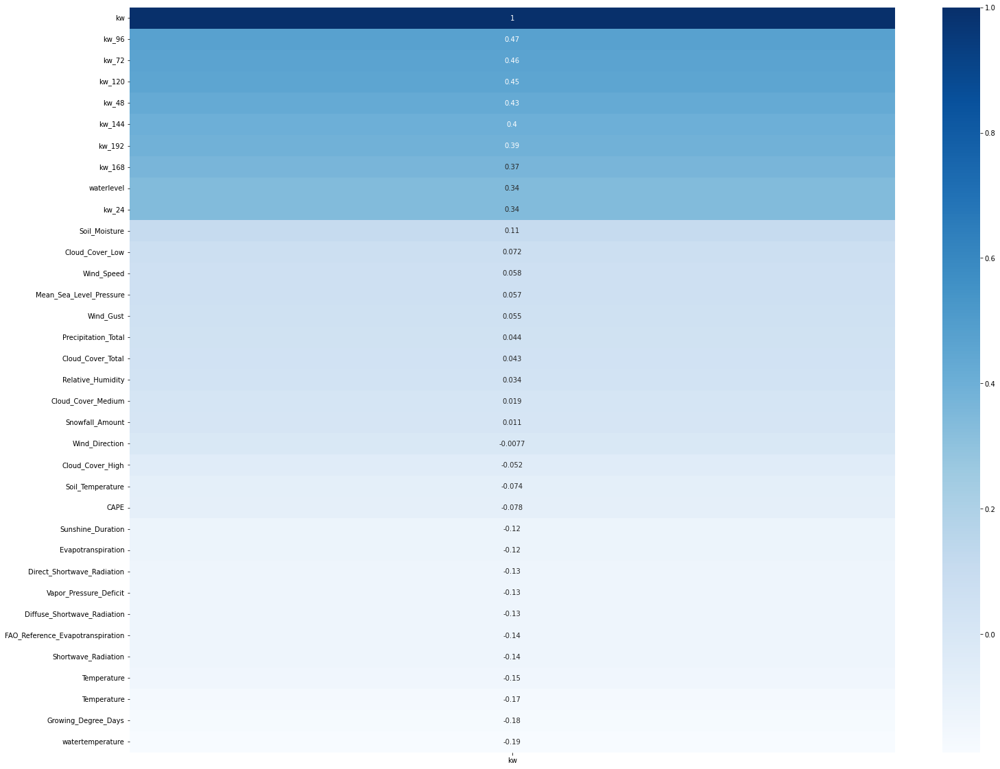

In [12]:
cor_matrix = pp.corr()
cor_matrix[['kw']]

f, ax = plt.subplots(figsize=(25, 20))
sns.heatmap(cor_matrix[['kw']].sort_values(by=['kw'], ascending =False), annot=True, cmap="Blues")
plt.show()

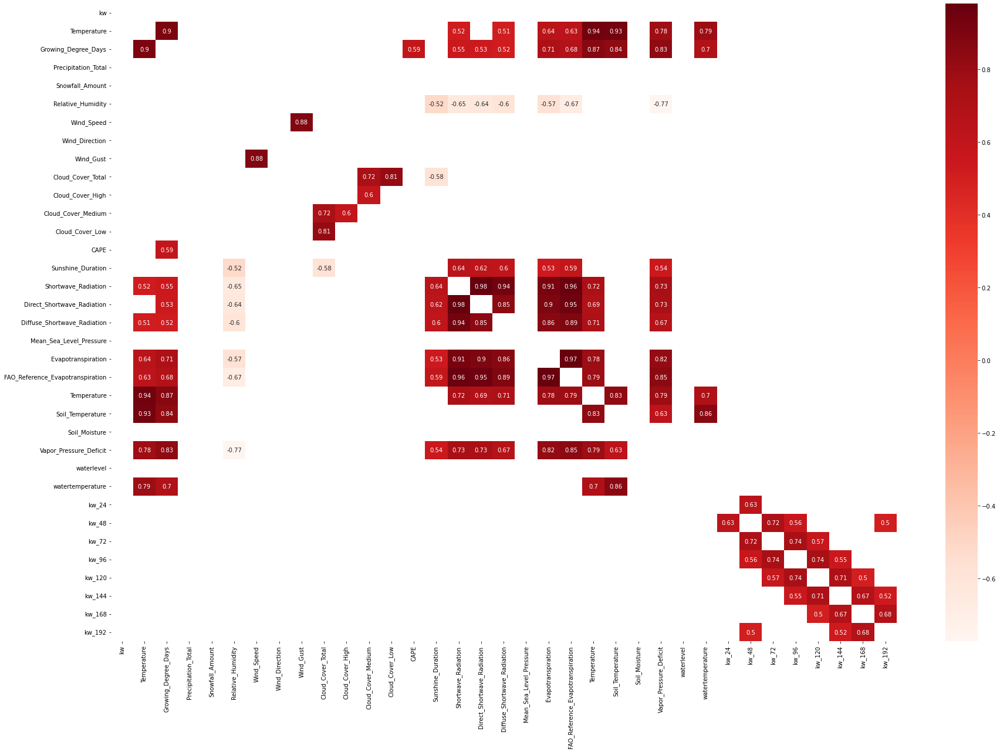

In [13]:
# Plot on correlation which is above 0.5 in both negative and positive

filteredDf = cor_matrix[((cor_matrix >= .5) | (cor_matrix <= -.5)) & (cor_matrix !=1.000)]
plt.figure(figsize=(30,20))
sns.heatmap(filteredDf, annot=True, cmap="Reds")
#plt.savefig('matrix.jpeg')
plt.show()

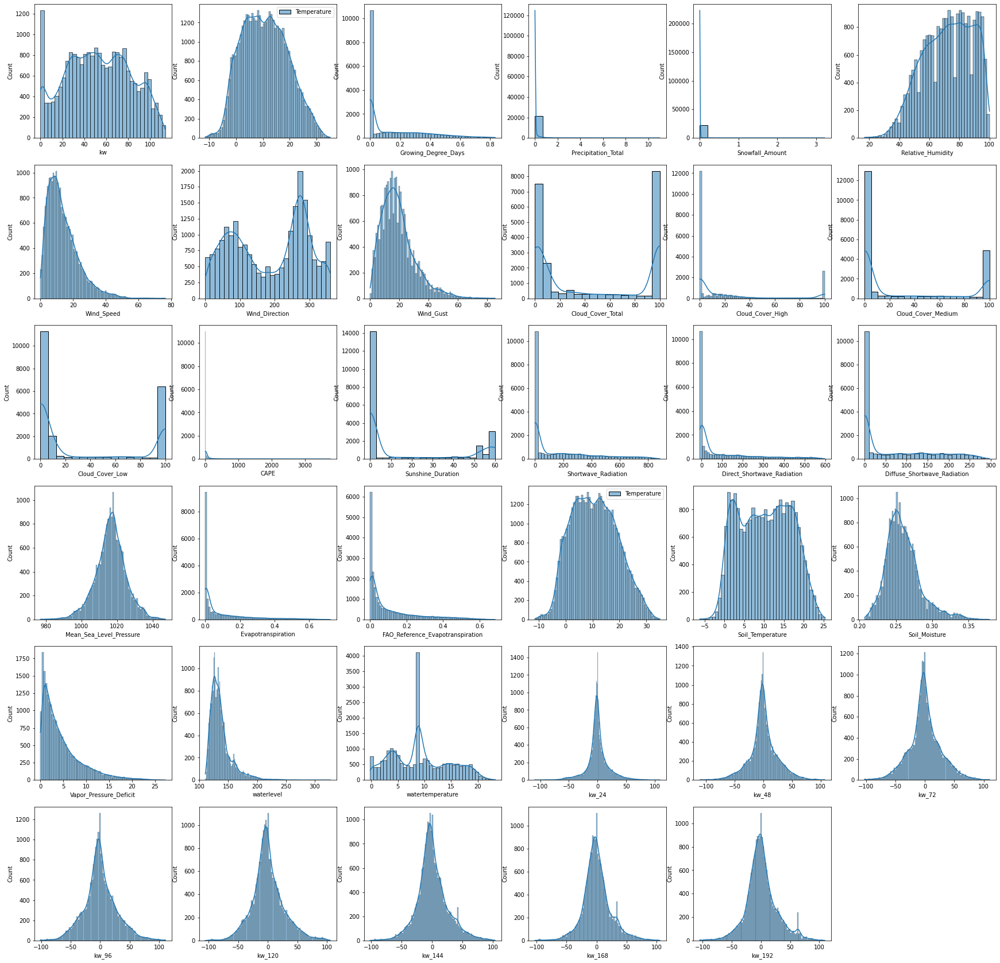

In [15]:
f, ax = plt.subplots(figsize=(30, 30))
for i, column in enumerate(pp.columns, 1):
    plt.subplot(6,6,i)
    sns.histplot(pp[column], legend=True, kde=True)

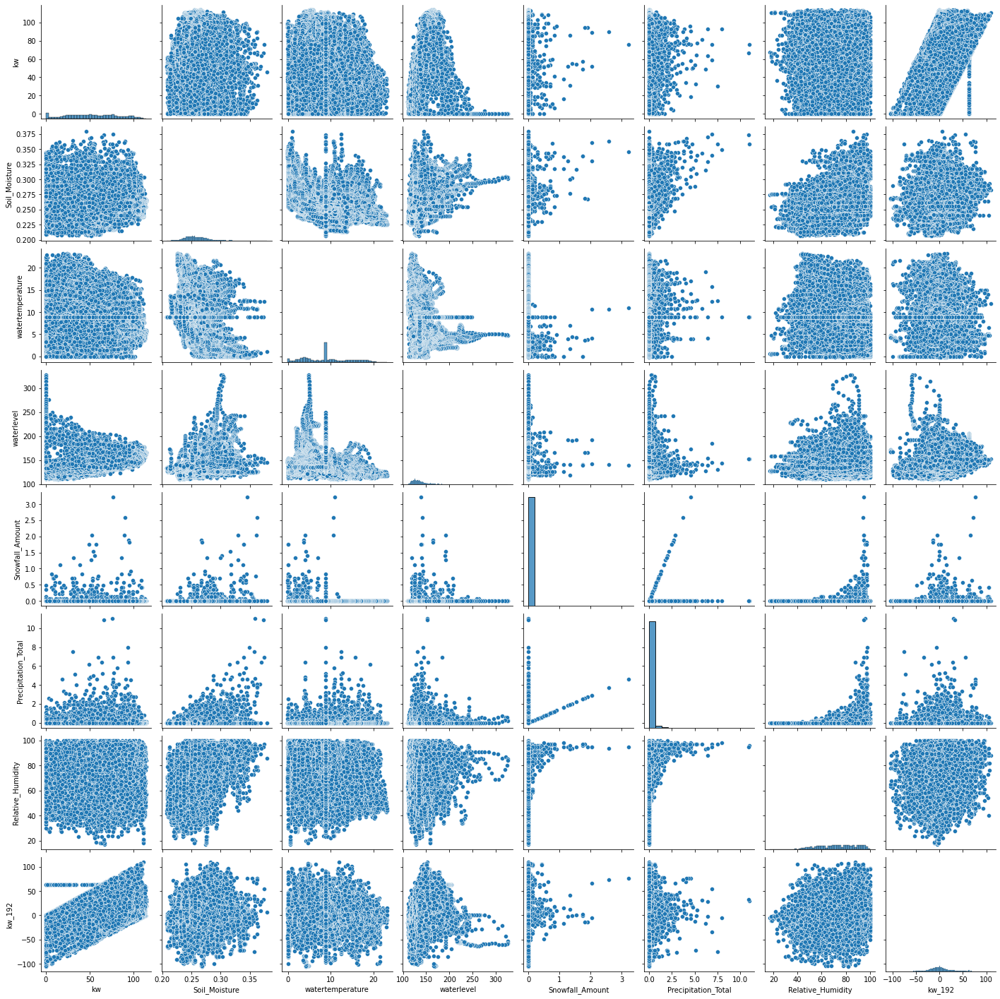

In [16]:
sns.pairplot(pp[['kw', "Soil_Moisture", "watertemperature","waterlevel",
                 "Snowfall_Amount", "Precipitation_Total", "Relative_Humidity", "kw_192"]])
plt.show()

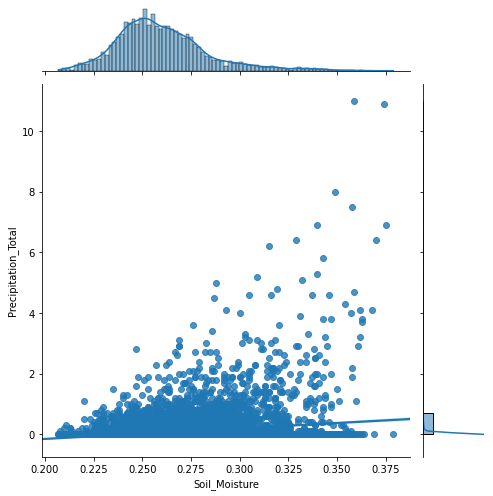

In [17]:
sns.jointplot(x="Soil_Moisture", y="Precipitation_Total", data=pp, kind="reg", truncate=False, height=7)

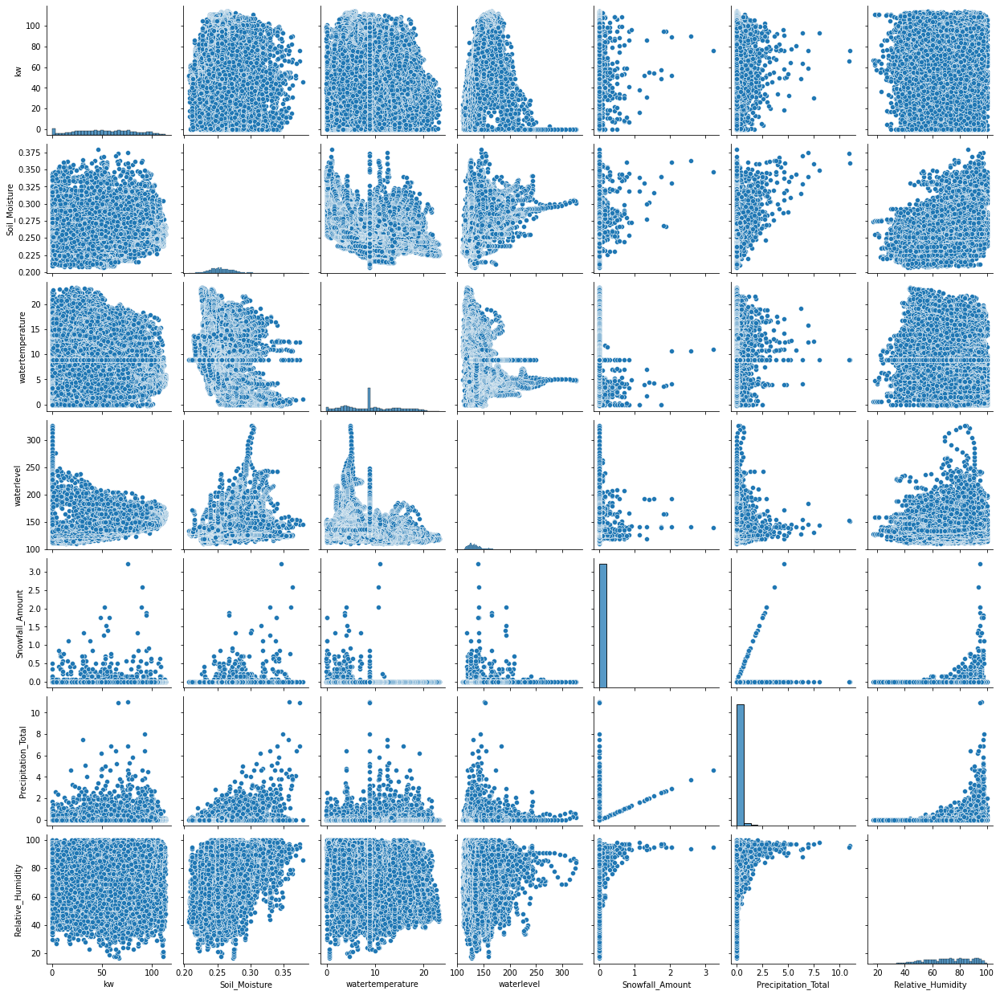

In [18]:
# Scatter plot for joint correlation

sns.pairplot(pp[['kw', "Soil_Moisture", "watertemperature","waterlevel",
                 "Snowfall_Amount", "Precipitation_Total", "Relative_Humidity"]])
plt.show()

The heatmap shows that past lag values of kw certain affect present kw values.

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


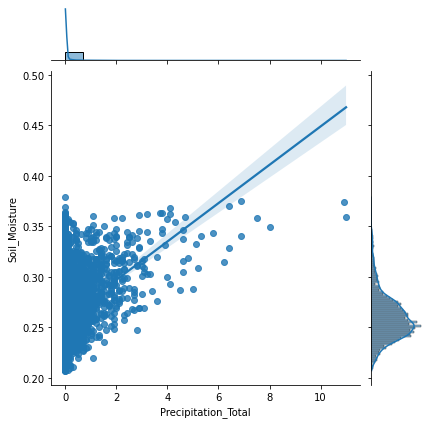

In [19]:
# pairplot of "Precipitation_Total" and "Soil_Moisture"
sns.jointplot("Precipitation_Total", "Soil_Moisture", data=pp, kind='reg');

In [20]:
# See for linear, quadratic or cubic relationship between 
fit1 = np.polyfit(pp["Soil_Moisture"], pp["Precipitation_Total"], 1)  # linear
fit2 = np.polyfit(pp["Soil_Moisture"], pp["Precipitation_Total"], 2)  # quadratic
fit3 = np.polyfit(pp["Soil_Moisture"], pp["Precipitation_Total"], 3)  # cubic

v1 = np.polyval(fit1, pp["Soil_Moisture"])
v2 = np.polyval(fit2, pp["Soil_Moisture"])
v3 = np.polyval(fit3, pp["Soil_Moisture"])

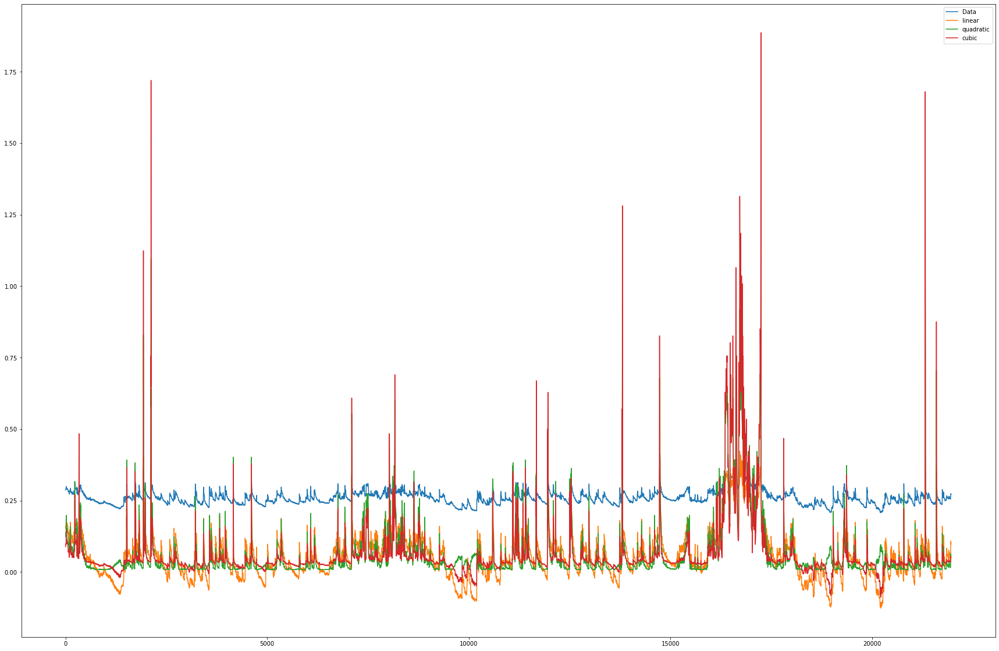

In [21]:
# looks like these both variables do seems to have strong correlation with each other as fit is quite close to
# original values

plt.figure(figsize=(30,20))
plt.plot(pp["Soil_Moisture"].values, label="Data")
plt.plot(v1, label = "linear")
plt.plot(v2, label = "quadratic")
plt.plot(v3, label = "cubic")
plt.legend()
plt.show()

In [22]:
# Split_sequence Function: 

def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequences)):
    # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out-1
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [23]:
# LSTM model Function

def build_lstm_model(n_neurons, lr, n_steps_in, n_features, n_steps_out):
    opt = keras.optimizers.Adam(learning_rate=lr)
    
    model = Sequential()
    
    model.add(LSTM(n_neurons, return_sequences=True, activation='tanh',
                   input_shape=(n_steps_in, n_features)))
    model.add(Dropout(0.3))
    
    model.add(LSTM(units=n_neurons, activation='tanh'))
    model.add(Dropout(0.3))
    
    model.add(Dense(n_steps_out, activation='linear'))
    model.compile(optimizer=opt, loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
    model.summary()
    
    return model



%history -g -f history.py

In [24]:
import plotly.express as px
sns.set(rc={'figure.figsize':(20,10)})
fig = px.line(pp, x=pp.index, y='kw', title='Production')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label='1y', step='year', stepmode='backward'),
            dict(count=2, label='3y', step='year', stepmode='backward'),
            dict(count=3, label='5y', step='year', stepmode='backward'),
            dict(step='all')
            ])
    )
)
fig.show()

# here you can see the gap in the data from 2014 to 2018. 
# This gap should simply be ignored, i.e. the data should be viewed as if this gap did not exist. 
# So the back part should just connect to the front part. 

In [25]:
def data_split(data, test_size):
    split = len(data)-test_size
    train = data[:split]
    test = data[split:]
    
    return (train, test)

In [26]:
# Data Preparation:
# X needs to be 25 stamps ahead, and kw needs to be same

# new dataset without Test values
data, Test = data_split(pp, 720+72)

# Now shift values by * hours, however as only need x features shifted, we will drop kw from this data and then add
# it again from original data with first time stamp
df = data.shift(-25)
df = df.fillna(method="pad")
df["kw"] = data["kw"]
df["kw_192"] = data["kw_192"]

test_df = Test.shift(-25)
test_df=test_df.fillna(method="pad")
test_df["kw"] = Test["kw"]
test_df["kw_192"] = Test["kw_192"]

In [27]:
# Data Normalization: Has to be done for better predictions. All columns values range will be between 0 and 1.

def prepare_time_series(X, y, input_steps=7, output_steps=7, past=7, PCA=False):
    
    scaler1 = MinMaxScaler(feature_range=(0, 1))
    x_scaled = scaler1.fit_transform(X)
    y_scaled = scaler1.fit_transform(y.reshape((-1, 1)))
    
    if PCA == True:
        # create few features
        pca = decomposition.PCA(n_components=5)
        X_std = pca.fit_transform(x_scaled)
        dataset_stacked = hstack((X_std, y_scaled))
        print ("dataset_stacked.shape" , dataset_stacked.shape)
        
    else:
        dataset_stacked = hstack((x_scaled, y_scaled))
        
    # choose a number of time steps # change this accordingly
    n_steps_in, n_steps_out = input_steps*past, output_steps 

        # covert into input/output
    x, Y = split_sequences(dataset_stacked, n_steps_in, n_steps_out)

    print ("X.shape" , x.shape) 
    print ("y.shape" , Y.shape) 
    
    return(x, Y)

In [28]:
def train_test_split(X, y, split_size=0.9):
    
    split_point = int(len(X)*split_size)
    train_X , train_y = X[:split_point, :] , y[:split_point, :]
    test_X , test_y = X[split_point:, :] , y[split_point:, :]

    n_features = train_X.shape[2]
    
    print ("train_X.shape" , train_X.shape) 
    print ("train_y.shape" , train_y.shape)  
    print ("test_X.shape" , test_X.shape) 
    print ("test_y.shape" , test_y.shape) 
    print ("n_features" , n_features)
    
    return(train_X, train_y, test_X, test_y)

### LSTM Model for daily data

As now dataset has become much smaller, we can try large number of parameters on this model.

## Grid Sarch Method to find Optimal parameters

The below code will apply random cross validation method to find optimal parameters:
1. n-neurons: Right now we are using 50 neurons, but it can increased or decreased 
to check if it affects model results.

2. lr = Learning rate: The learning rate is an important parameter, it seems that smaller values decrease
model overfitting

3. batch_size: One batch contains 720 time steps, so it size should be a small number. Between 10-20 at maximum

4. epoch size: I have go with 100 epoch size, but we can add other number of epochs to look for better model

All these parameters are combined in dict to fed to RandomizedSearchCV method.

In the last steps the models we build with random search cv, are fitted to the data.

### Fit Different parameters and find best model.

In [29]:
# define the grid search parameters
learning_rate = [0.01, 0.001]
neurons = [50]
batch_size = [72]
epoch = [100]
params = dict(batch_size=batch_size, n_neurons=neurons, lr=learning_rate,
                     epochs=epoch)

def cross_validation(train_x, train_y, valid_x, valid_y, params_distrib= params):
    n_steps_in, n_features, n_steps_out = train_x.shape[1], train_x.shape[2], valid_y.shape[1]
    keras_reg = KerasRegressor(build_lstm_model, n_steps_in = n_steps_in, n_features=n_features,
                                       n_steps_out=n_steps_out)

    rnd_search_cv = RandomizedSearchCV(keras_reg, params_distrib, cv=3,n_iter=2,
                                       scoring="r2")
    grid_result = rnd_search_cv.fit(train_x, train_y, epochs=50, 
                    validation_data=(valid_x, valid_y))
    
    # summarize results
    print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    means = grid_result.cv_results_['mean_test_score']
    stds = grid_result.cv_results_['std_test_score']
    params = grid_result.cv_results_['params']
    for mean, stdev, param in zip(means, stds, params):
        print("Mean: %f (Standard Deviation: %f) with: %r" % (mean, stdev, param))
    
    # Accuracy and loss
    fig = plt.figure(figsize=(20,7))
    fig.add_subplot(121)
    plt.plot(grid_result.best_estimator_.model.history.history['root_mean_squared_error'])
    plt.plot(grid_result.best_estimator_.model.history.history['val_root_mean_squared_error'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')

    #Adding Subplot 1 (For Loss)
    fig.add_subplot(122)

    plt.plot(grid_result.best_estimator_.model.history.history['loss'], label="loss")
    plt.plot(grid_result.best_estimator_.model.history.history['val_loss'], label="val_loss")

    plt.title("Loss", fontsize=18)
    plt.xlabel("Epochs", fontsize=15)
    plt.ylabel("Loss", fontsize=15)
    plt.grid(alpha=0.3)
    plt.legend()

    plt.show()
    return grid_result

## Model 1: Selected Features with shifting features values to future

In [30]:

x1 = df[['kw','Temperature', 'Soil_Temperature', 'Sunshine_Duration',
                 'Precipitation_Total', 'waterlevel', 'watertemperature', 'kw_192']].copy()

y = df["kw"].values

n_steps_in, past,  n_steps_out = 24, 3, 24
X, Y = prepare_time_series(x1.values, y, input_steps=n_steps_in, output_steps=n_steps_out, past=past)

X_train, y_train, x_test, y_test = train_test_split(X, Y)

X.shape (21074, 72, 9)
y.shape (21074, 24)
train_X.shape (18966, 72, 9)
train_y.shape (18966, 24)
test_X.shape (2108, 72, 9)
test_y.shape (2108, 24)
n_features 9


2021-12-12 09:43:14.659277: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 09:43:14.670524: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 09:43:14.671484: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 09:43:14.674064: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-12 09:43:14.675020: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1050] successful NUMA node read f

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 72, 50)            12000     
_________________________________________________________________
dropout (Dropout)            (None, 72, 50)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dropout_1 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense (Dense)                (None, 24)                1224      
Total params: 33,424
Trainable params: 33,424
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50


2021-12-12 09:43:16.394076: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2021-12-12 09:43:19.952682: I tensorflow/stream_executor/cuda/cuda_dnn.cc:381] Loaded cuDNN version 8204


176/176 [==============================] - 7s 11ms/step - loss: 0.0331 - root_mean_squared_error: 0.1819 - val_loss: 0.0303 - val_root_mean_squared_error: 0.1741
Epoch 2/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0188 - root_mean_squared_error: 0.1369 - val_loss: 0.0267 - val_root_mean_squared_error: 0.1636
Epoch 3/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0157 - root_mean_squared_error: 0.1253 - val_loss: 0.0263 - val_root_mean_squared_error: 0.1622
Epoch 4/50
176/176 [==============================] - 1s 9ms/step - loss: 0.0145 - root_mean_squared_error: 0.1204 - val_loss: 0.0258 - val_root_mean_squared_error: 0.1608
Epoch 5/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0137 - root_mean_squared_error: 0.1169 - val_loss: 0.0230 - val_root_mean_squared_error: 0.1518
Epoch 6/50
176/176 [==============================] - 1s 9ms/step - loss: 0.0128 - root_mean_squared_error: 0.1133 - val_loss: 0.0235 - val_root_mean_

176/176 [==============================] - 1s 8ms/step - loss: 0.0048 - root_mean_squared_error: 0.0693 - val_loss: 0.0396 - val_root_mean_squared_error: 0.1990
Epoch 49/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0048 - root_mean_squared_error: 0.0695 - val_loss: 0.0329 - val_root_mean_squared_error: 0.1815
Epoch 50/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0048 - root_mean_squared_error: 0.0695 - val_loss: 0.0371 - val_root_mean_squared_error: 0.1925
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 72, 50)            12000     
_________________________________________________________________
dropout_2 (Dropout)          (None, 72, 50)            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 50)                20200     
_________

176/176 [==============================] - 1s 8ms/step - loss: 0.0057 - root_mean_squared_error: 0.0755 - val_loss: 0.0318 - val_root_mean_squared_error: 0.1782
Epoch 40/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0056 - root_mean_squared_error: 0.0750 - val_loss: 0.0303 - val_root_mean_squared_error: 0.1739
Epoch 41/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0052 - root_mean_squared_error: 0.0722 - val_loss: 0.0376 - val_root_mean_squared_error: 0.1939
Epoch 42/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0051 - root_mean_squared_error: 0.0711 - val_loss: 0.0336 - val_root_mean_squared_error: 0.1833
Epoch 43/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0051 - root_mean_squared_error: 0.0712 - val_loss: 0.0318 - val_root_mean_squared_error: 0.1783
Epoch 44/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0051 - root_mean_squared_error: 0.0714 - val_loss: 0.0318 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0060 - root_mean_squared_error: 0.0773 - val_loss: 0.0296 - val_root_mean_squared_error: 0.1721
Epoch 31/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0057 - root_mean_squared_error: 0.0756 - val_loss: 0.0321 - val_root_mean_squared_error: 0.1790
Epoch 32/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0058 - root_mean_squared_error: 0.0759 - val_loss: 0.0332 - val_root_mean_squared_error: 0.1822
Epoch 33/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0057 - root_mean_squared_error: 0.0755 - val_loss: 0.0298 - val_root_mean_squared_error: 0.1727
Epoch 34/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0057 - root_mean_squared_error: 0.0752 - val_loss: 0.0308 - val_root_mean_squared_error: 0.1755
Epoch 35/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0056 - root_mean_squared_error: 0.0748 - val_loss: 0.0314 - val_root_m

176/176 [==============================] - 2s 9ms/step - loss: 0.0102 - root_mean_squared_error: 0.1011 - val_loss: 0.0268 - val_root_mean_squared_error: 0.1638
Epoch 22/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0099 - root_mean_squared_error: 0.0997 - val_loss: 0.0252 - val_root_mean_squared_error: 0.1589
Epoch 23/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0097 - root_mean_squared_error: 0.0985 - val_loss: 0.0285 - val_root_mean_squared_error: 0.1688
Epoch 24/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0095 - root_mean_squared_error: 0.0976 - val_loss: 0.0276 - val_root_mean_squared_error: 0.1661
Epoch 25/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0093 - root_mean_squared_error: 0.0962 - val_loss: 0.0273 - val_root_mean_squared_error: 0.1652
Epoch 26/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0088 - root_mean_squared_error: 0.0938 - val_loss: 0.0294 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0134 - root_mean_squared_error: 0.1156 - val_loss: 0.0275 - val_root_mean_squared_error: 0.1657
Epoch 13/50
176/176 [==============================] - 2s 9ms/step - loss: 0.0133 - root_mean_squared_error: 0.1155 - val_loss: 0.0273 - val_root_mean_squared_error: 0.1652
Epoch 14/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0127 - root_mean_squared_error: 0.1126 - val_loss: 0.0283 - val_root_mean_squared_error: 0.1683
Epoch 15/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0123 - root_mean_squared_error: 0.1107 - val_loss: 0.0304 - val_root_mean_squared_error: 0.1742
Epoch 16/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0117 - root_mean_squared_error: 0.1083 - val_loss: 0.0320 - val_root_mean_squared_error: 0.1790
Epoch 17/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0115 - root_mean_squared_error: 0.1073 - val_loss: 0.0303 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0234 - root_mean_squared_error: 0.1529 - val_loss: 0.0316 - val_root_mean_squared_error: 0.1777
Epoch 4/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0200 - root_mean_squared_error: 0.1416 - val_loss: 0.0267 - val_root_mean_squared_error: 0.1635
Epoch 5/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0177 - root_mean_squared_error: 0.1331 - val_loss: 0.0274 - val_root_mean_squared_error: 0.1654
Epoch 6/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0161 - root_mean_squared_error: 0.1269 - val_loss: 0.0258 - val_root_mean_squared_error: 0.1607
Epoch 7/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0151 - root_mean_squared_error: 0.1228 - val_loss: 0.0247 - val_root_mean_squared_error: 0.1571
Epoch 8/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0144 - root_mean_squared_error: 0.1202 - val_loss: 0.0231 - val_root_mean_s

176/176 [==============================] - 1s 8ms/step - loss: 0.0062 - root_mean_squared_error: 0.0786 - val_loss: 0.0303 - val_root_mean_squared_error: 0.1742
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 72, 50)            12000     
_________________________________________________________________
dropout_12 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_13 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dropout_13 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 24)                1224      
Total params: 33,424
Trainable params: 33,424
Non-trainable params: 0
_____________________

264/264 [==============================] - 2s 8ms/step - loss: 0.0063 - root_mean_squared_error: 0.0794 - val_loss: 0.0313 - val_root_mean_squared_error: 0.1768
Epoch 42/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0062 - root_mean_squared_error: 0.0786 - val_loss: 0.0306 - val_root_mean_squared_error: 0.1750
Epoch 43/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0061 - root_mean_squared_error: 0.0782 - val_loss: 0.0269 - val_root_mean_squared_error: 0.1640
Epoch 44/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0061 - root_mean_squared_error: 0.0783 - val_loss: 0.0320 - val_root_mean_squared_error: 0.1788
Epoch 45/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0060 - root_mean_squared_error: 0.0775 - val_loss: 0.0370 - val_root_mean_squared_error: 0.1923
Epoch 46/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0059 - root_mean_squared_error: 0.0770 - val_loss: 0.0332 - val_root_m

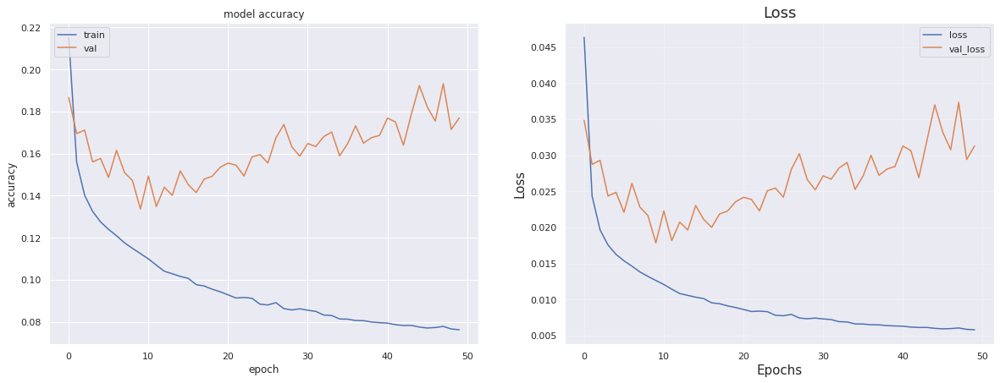

In [31]:
results1 = cross_validation(X_train, y_train, x_test, y_test)

In [32]:
# TEST DATA Fucntions

def prep_data(x, y_test , start , end , last, model, n_steps_out=24):
    #prepare test data X
    dataset_test_X = x[start:end, :]
    test_X_new = dataset_test_X.reshape(1,dataset_test_X.shape[0],dataset_test_X.shape[1])
    past_data = y_test[:end]
    dataset_test_y = y_test[end:last]
    scaler1 = MinMaxScaler(feature_range=(0, 1))
    scaler1.fit(dataset_test_y.values.reshape(-1, 1))
    y_pred = model.predict(test_X_new).reshape(-1, 1)
    y_pred_inv = scaler1.inverse_transform(y_pred)
    y_pred_inv = y_pred_inv.reshape(n_steps_out,1)
    y_pred_inv = y_pred_inv[:,0]
    
    return y_pred_inv , dataset_test_y , past_data


def evaluate_prediction(predictions, actual, model_name , start , end):
    errors = predictions - actual
    mse = np.square(errors).mean()
    rmse = np.sqrt(mse)
    mae = np.abs(errors).mean()
    r2 = 1-(sum(errors**2)/sum((actual-np.mean(actual))**2))
    print("Test Data from {} to {}".format(str(start), str(end)))
    print('Mean Square Error: {:.2f}'.format(mse))
    print('Mean Absolute Error: {:.2f}'.format(mae))
    print('Root Mean Square Error: {:.2f}'.format(rmse))
    print('R-Square: {:.2f}'.format(r2_score(actual,predictions)))
    print('')
    print('')
    d = {"MSE": mse, "RMSE": rmse, "MAE": mae, "R^2": r2}
    data = pd.DataFrame(d, index=[str(start)+" : "+str(end)])
    
    return(data)

In [33]:
# Plot history and future
def plot_multistep(history, prediction1 , groundtruth , start , end):
    plt.figure(figsize=(20, 4))
    
    y_mean = mean(prediction1)
    
    plt.plot(history.index, np.array(history), label='History')
    plt.plot(groundtruth.index, np.array(prediction1),label='Forecasted with LSTM')
    plt.plot(groundtruth.index, np.array(groundtruth),label='GroundTruth')
    
    plt.legend(loc='lower left')
    plt.title("Test Data from {} to {} , Mean = {:.2f}".format(history.index[0],
                               groundtruth.index[-1], y_mean) ,  fontsize=18)
    plt.xlabel('Time stamp' ,  fontsize=18)
    plt.ylabel('y-value' , fontsize=18)

In [34]:
# prepare test data
# Now shift values by * days

x_test = test_df[['kw','Temperature', 'Soil_Temperature', 'Sunshine_Duration',
                 'Precipitation_Total', 'waterlevel', 'watertemperature', 'kw_192']].copy()

y_test = test_df['kw']

scaler = MinMaxScaler(feature_range=(0, 1))

test_scaled = scaler.fit_transform(x_test.values)

Test Data from 2021-08-02 00:00:00 to 2021-08-02 23:00:00
Mean Square Error: 242.16
Mean Absolute Error: 13.32
Root Mean Square Error: 15.56
R-Square: 0.19


Test Data from 2021-08-03 00:00:00 to 2021-08-03 23:00:00
Mean Square Error: 156.79
Mean Absolute Error: 10.78
Root Mean Square Error: 12.52
R-Square: 0.58


Test Data from 2021-08-04 00:00:00 to 2021-08-04 23:00:00
Mean Square Error: 256.29
Mean Absolute Error: 13.80
Root Mean Square Error: 16.01
R-Square: 0.54


Test Data from 2021-08-05 00:00:00 to 2021-08-05 23:00:00
Mean Square Error: 68.35
Mean Absolute Error: 6.84
Root Mean Square Error: 8.27
R-Square: 0.62


Test Data from 2021-08-06 00:00:00 to 2021-08-06 23:00:00
Mean Square Error: 188.21
Mean Absolute Error: 11.45
Root Mean Square Error: 13.72
R-Square: 0.36


Test Data from 2021-08-07 00:00:00 to 2021-08-07 23:00:00
Mean Square Error: 19.31
Mean Absolute Error: 3.28
Root Mean Square Error: 4.39
R-Square: -0.14


Test Data from 2021-08-08 00:00:00 to 2021-08-08 23:00:00

/tmp/ipykernel_1630/1491488613.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Test Data from 2021-08-22 00:00:00 to 2021-08-22 23:00:00
Mean Square Error: 44.71
Mean Absolute Error: 5.01
Root Mean Square Error: 6.69
R-Square: 0.03


Test Data from 2021-08-23 00:00:00 to 2021-08-23 23:00:00
Mean Square Error: 400.81
Mean Absolute Error: 17.25
Root Mean Square Error: 20.02
R-Square: 0.17


Test Data from 2021-08-24 00:00:00 to 2021-08-24 23:00:00
Mean Square Error: 406.00
Mean Absolute Error: 16.75
Root Mean Square Error: 20.15
R-Square: 0.21


Test Data from 2021-08-25 00:00:00 to 2021-08-25 23:00:00
Mean Square Error: 337.78
Mean Absolute Error: 14.80
Root Mean Square Error: 18.38
R-Square: -0.85


Test Data from 2021-08-26 00:00:00 to 2021-08-26 23:00:00
Mean Square Error: 156.99
Mean Absolute Error: 10.31
Root Mean Square Error: 12.53
R-Square: 0.39


Test Data from 2021-08-27 00:00:00 to 2021-08-27 23:00:00
Mean Square Error: 1227.08
Mean Absolute Error: 29.65
Root Mean Square Error: 35.03
R-Square: -1.71


Test Data from 2021-08-28 00:00:00 to 2021-08-28 23:

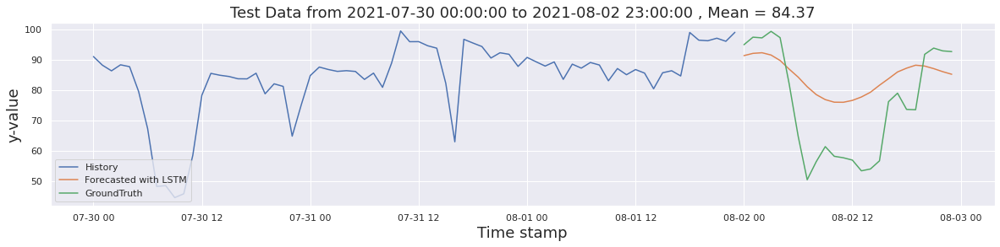

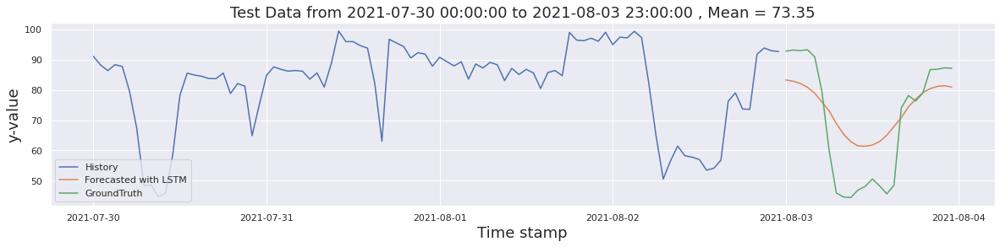

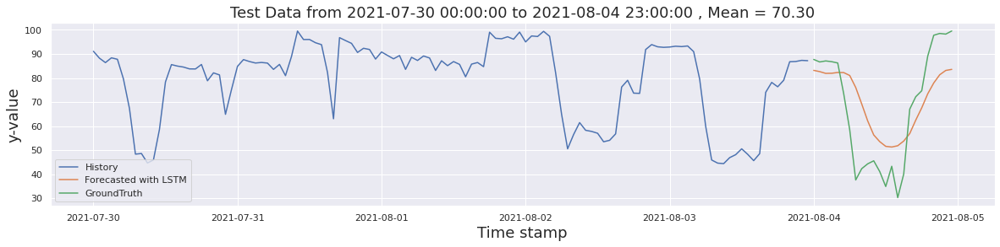

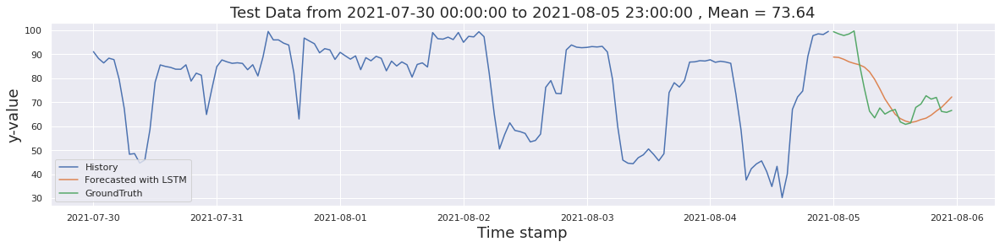

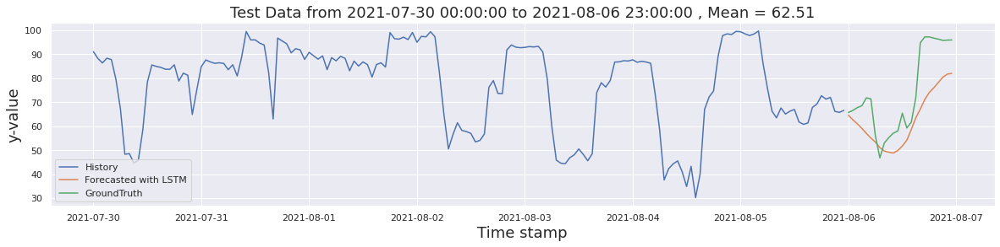

...

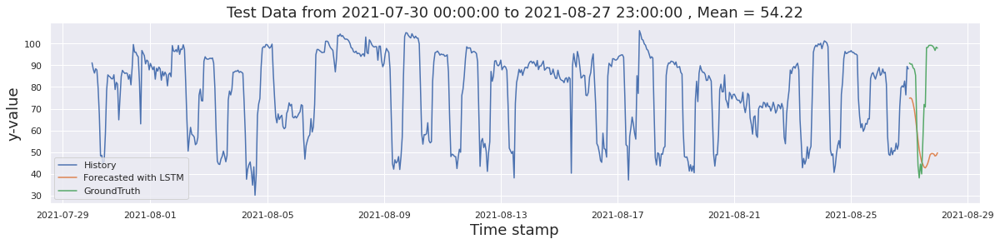

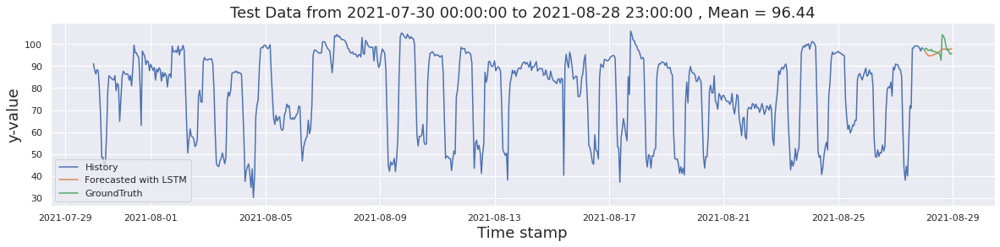

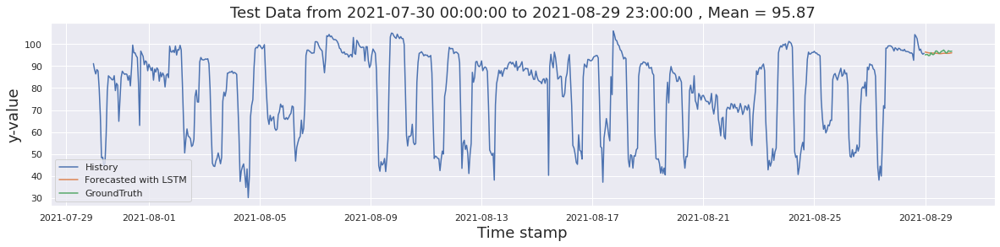

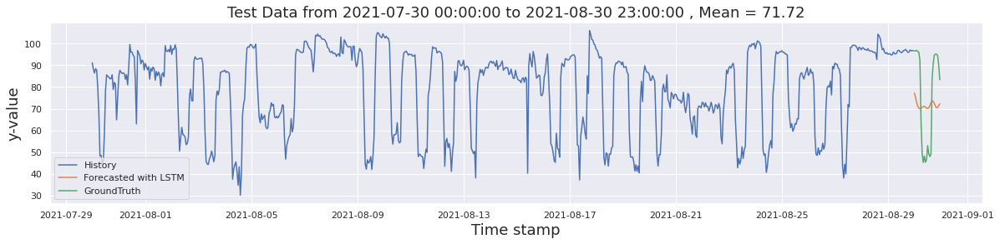

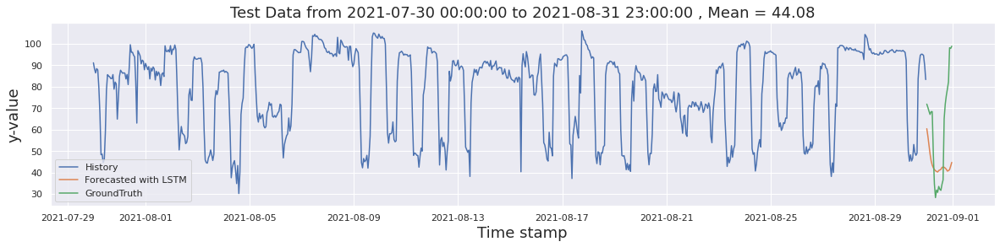

In [35]:
# all test batches

dfs1 = pd.DataFrame() # to save predictions
past = pd.DataFrame() # to save past data which is not used to evaluate metrics
error_metrics_1 = pd.DataFrame() # To save error metrics


for i in range(0,720,24):
    n_steps_in = 72
    n_steps_out = 24
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out
    
    # prepare data for time series sequence
    y_pred_inv , dataset_test_y , past_data = prep_data(test_scaled, y_test, start,
                                                        end, last, results1)
    # plot the sequence
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end)
    
    # calculate errors and then return dataframe
    errors = evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , dataset_test_y.index[0],
                                 dataset_test_y.index[-1])
    
    
    # concat with previour error data frames
    error_metrics_1 = pd.concat([error_metrics_1, errors], ignore_index=False)
    
    # save past data
    past = pd.DataFrame()
    past["past"] = past_data
    
    # concat with previour past data frames
    past = pd.concat([past], ignore_index=False)
    
    # create data to save multiple colums
    d = pd.DataFrame()
    d["Ground Truth"] = dataset_test_y
    d["Predictions"] = y_pred_inv
    
    # concat with outside dataframe to save all results
    dfs1 = pd.concat([dfs1, d], ignore_index=False)

# Now merge past and predictions dataframe on date column
all_data1 = past.merge(dfs1, right_index=True, left_index=True, how="outer")

In [36]:
all_data1.to_csv(os.path.join(forecast, "pm_lstm_h_2.csv"))

In [37]:
# close all plots
plt.close('all')

In [38]:
fig1 = px.line(all_data1, x=all_data1.index, y=["past", "Ground Truth", "Predictions"])
                                            
fig1.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=24, label='1 Day', step='hour', stepmode='backward'),
            dict(count=3*24, label='3 Day', step='hour', stepmode='backward'),
            dict(count=5*24, label='5 Day', step='hour', stepmode='backward'),
            dict(count=7*24, label='7 Day', step='hour', stepmode='backward'),
            dict(step='all')
            ])
    )
)

# Show plot 
fig1.show()

#fig1.write_html("model_hour_1.html")

In [39]:
error_metrics_1

,MSE,RMSE,MAE,R^2
2021-08-02 00:00:00 : 2021-08-02 23:00:00,242.159390,15.561471,13.320342,0.193575
2021-08-03 00:00:00 : 2021-08-03 23:00:00,156.791822,12.521654,10.776090,0.579392
2021-08-04 00:00:00 : 2021-08-04 23:00:00,256.289262,16.009037,13.801232,0.542485
2021-08-05 00:00:00 : 2021-08-05 23:00:00,68.353646,8.267626,6.844128,0.624209
2021-08-06 00:00:00 : 2021-08-06 23:00:00,188.211818,13.719031,11.453254,0.355859
2021-08-07 00:00:00 : 2021-08-07 23:00:00,19.309935,4.394307,3.277279,-0.141343
2021-08-08 00:00:00 : 2021-08-08 23:00:00,30.836709,5.553081,4.689215,-2.194005
2021-08-09 00:00:00 : 2021-08-09 23:00:00,705.825598,26.567378,22.368295,-0.090819
2021-08-10 00:00:00 : 2021-08-10 23:00:00,294.515207,17.161445,13.204053,0.240137
2021-08-11 00:00:00 : 2021-08-11 23:00:00,357.232815,18.900604,15.131384,0.238935


## Model 2: Using past 3 days Kw values to predict future day kw values

In [40]:
x1 = df["kw"].values.reshape(-1, 1)
y = df["kw"].values

n_steps_in, past,  n_steps_out = 24, 3, 24
X, Y = prepare_time_series(x1, y, input_steps=n_steps_in, output_steps=n_steps_out, past=past)

X_train, y_train, x_test, y_test = train_test_split(X, Y)

X.shape (21074, 72, 1)
y.shape (21074, 24)
train_X.shape (18966, 72, 1)
train_y.shape (18966, 24)
test_X.shape (2108, 72, 1)
test_y.shape (2108, 24)
n_features 1


Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_14 (LSTM)               (None, 72, 50)            10400     
_________________________________________________________________
dropout_14 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_15 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dropout_15 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 24)                1224      
Total params: 31,824
Trainable params: 31,824
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
176/176 [==============================] - 4s 11ms/step - loss: 0.0375 - root_mean_squared_error: 0.1938 

176/176 [==============================] - 1s 8ms/step - loss: 0.0086 - root_mean_squared_error: 0.0928 - val_loss: 0.0240 - val_root_mean_squared_error: 0.1550
Epoch 43/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0084 - root_mean_squared_error: 0.0914 - val_loss: 0.0236 - val_root_mean_squared_error: 0.1537
Epoch 44/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0084 - root_mean_squared_error: 0.0918 - val_loss: 0.0240 - val_root_mean_squared_error: 0.1550
Epoch 45/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0082 - root_mean_squared_error: 0.0906 - val_loss: 0.0237 - val_root_mean_squared_error: 0.1540
Epoch 46/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0095 - root_mean_squared_error: 0.0975 - val_loss: 0.0235 - val_root_mean_squared_error: 0.1533
Epoch 47/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0089 - root_mean_squared_error: 0.0946 - val_loss: 0.0232 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0109 - root_mean_squared_error: 0.1042 - val_loss: 0.0226 - val_root_mean_squared_error: 0.1502
Epoch 34/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0108 - root_mean_squared_error: 0.1039 - val_loss: 0.0223 - val_root_mean_squared_error: 0.1494
Epoch 35/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0106 - root_mean_squared_error: 0.1030 - val_loss: 0.0237 - val_root_mean_squared_error: 0.1538
Epoch 36/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0103 - root_mean_squared_error: 0.1017 - val_loss: 0.0227 - val_root_mean_squared_error: 0.1506
Epoch 37/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0105 - root_mean_squared_error: 0.1027 - val_loss: 0.0221 - val_root_mean_squared_error: 0.1486
Epoch 38/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0102 - root_mean_squared_error: 0.1010 - val_loss: 0.0224 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0131 - root_mean_squared_error: 0.1143 - val_loss: 0.0282 - val_root_mean_squared_error: 0.1680
Epoch 25/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0125 - root_mean_squared_error: 0.1117 - val_loss: 0.0247 - val_root_mean_squared_error: 0.1571
Epoch 26/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0127 - root_mean_squared_error: 0.1129 - val_loss: 0.0253 - val_root_mean_squared_error: 0.1590
Epoch 27/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0124 - root_mean_squared_error: 0.1112 - val_loss: 0.0260 - val_root_mean_squared_error: 0.1613
Epoch 28/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0122 - root_mean_squared_error: 0.1102 - val_loss: 0.0262 - val_root_mean_squared_error: 0.1617
Epoch 29/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0119 - root_mean_squared_error: 0.1092 - val_loss: 0.0264 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0184 - root_mean_squared_error: 0.1356 - val_loss: 0.0278 - val_root_mean_squared_error: 0.1669
Epoch 16/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0181 - root_mean_squared_error: 0.1346 - val_loss: 0.0273 - val_root_mean_squared_error: 0.1653
Epoch 17/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0176 - root_mean_squared_error: 0.1326 - val_loss: 0.0267 - val_root_mean_squared_error: 0.1635
Epoch 18/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0174 - root_mean_squared_error: 0.1318 - val_loss: 0.0260 - val_root_mean_squared_error: 0.1613
Epoch 19/50
176/176 [==============================] - 1s 9ms/step - loss: 0.0171 - root_mean_squared_error: 0.1307 - val_loss: 0.0258 - val_root_mean_squared_error: 0.1606
Epoch 20/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0169 - root_mean_squared_error: 0.1299 - val_loss: 0.0264 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0229 - root_mean_squared_error: 0.1514 - val_loss: 0.0316 - val_root_mean_squared_error: 0.1778
Epoch 7/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0227 - root_mean_squared_error: 0.1506 - val_loss: 0.0299 - val_root_mean_squared_error: 0.1730
Epoch 8/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0221 - root_mean_squared_error: 0.1486 - val_loss: 0.0299 - val_root_mean_squared_error: 0.1729
Epoch 9/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0216 - root_mean_squared_error: 0.1470 - val_loss: 0.0287 - val_root_mean_squared_error: 0.1694
Epoch 10/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0211 - root_mean_squared_error: 0.1452 - val_loss: 0.0291 - val_root_mean_squared_error: 0.1707
Epoch 11/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0209 - root_mean_squared_error: 0.1445 - val_loss: 0.0284 - val_root_mean

176/176 [==============================] - 4s 11ms/step - loss: 0.0561 - root_mean_squared_error: 0.2369 - val_loss: 0.0446 - val_root_mean_squared_error: 0.2111
Epoch 2/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0311 - root_mean_squared_error: 0.1762 - val_loss: 0.0423 - val_root_mean_squared_error: 0.2058
Epoch 3/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0273 - root_mean_squared_error: 0.1652 - val_loss: 0.0360 - val_root_mean_squared_error: 0.1898
Epoch 4/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0240 - root_mean_squared_error: 0.1550 - val_loss: 0.0327 - val_root_mean_squared_error: 0.1810
Epoch 5/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0229 - root_mean_squared_error: 0.1512 - val_loss: 0.0318 - val_root_mean_squared_error: 0.1784
Epoch 6/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0218 - root_mean_squared_error: 0.1477 - val_loss: 0.0315 - val_root_mean_

176/176 [==============================] - 1s 8ms/step - loss: 0.0125 - root_mean_squared_error: 0.1119 - val_loss: 0.0277 - val_root_mean_squared_error: 0.1664
Epoch 49/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0121 - root_mean_squared_error: 0.1100 - val_loss: 0.0304 - val_root_mean_squared_error: 0.1744
Epoch 50/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0119 - root_mean_squared_error: 0.1091 - val_loss: 0.0257 - val_root_mean_squared_error: 0.1602
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_26 (LSTM)               (None, 72, 50)            10400     
_________________________________________________________________
dropout_26 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_27 (LSTM)               (None, 50)                20200     
________

264/264 [==============================] - 2s 8ms/step - loss: 0.0130 - root_mean_squared_error: 0.1141 - val_loss: 0.0236 - val_root_mean_squared_error: 0.1535
Epoch 40/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0129 - root_mean_squared_error: 0.1137 - val_loss: 0.0243 - val_root_mean_squared_error: 0.1559
Epoch 41/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0128 - root_mean_squared_error: 0.1133 - val_loss: 0.0228 - val_root_mean_squared_error: 0.1511
Epoch 42/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0127 - root_mean_squared_error: 0.1129 - val_loss: 0.0236 - val_root_mean_squared_error: 0.1535
Epoch 43/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0124 - root_mean_squared_error: 0.1114 - val_loss: 0.0228 - val_root_mean_squared_error: 0.1509
Epoch 44/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0122 - root_mean_squared_error: 0.1104 - val_loss: 0.0252 - val_root_m

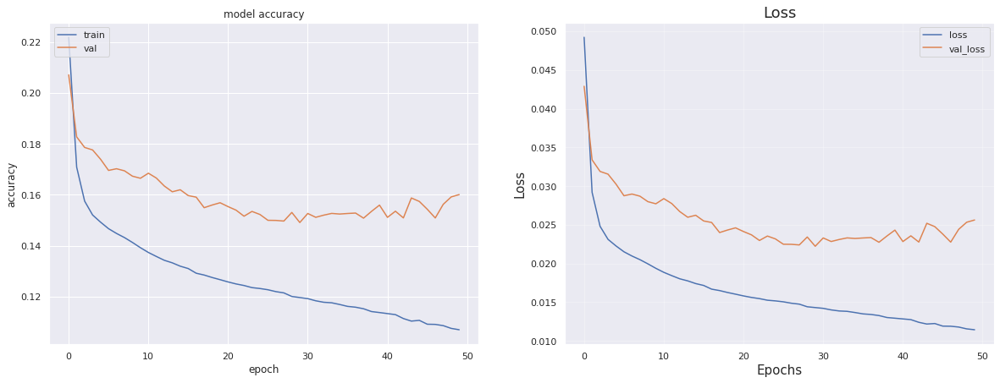

In [41]:
results2 = cross_validation(X_train, y_train, x_test, y_test)

In [42]:
x_test = test_df["kw"].values.reshape(-1, 1)
y_test = test_df['kw']



scaler = MinMaxScaler(feature_range=(0, 1))

test_scaled = scaler.fit_transform(x_test)

Test Data from 2021-08-02 00:00:00 to 2021-08-02 23:00:00
Mean Square Error: 420.65
Mean Absolute Error: 16.18
Root Mean Square Error: 20.51
R-Square: -0.40


Test Data from 2021-08-03 00:00:00 to 2021-08-03 23:00:00
Mean Square Error: 156.81
Mean Absolute Error: 11.42
Root Mean Square Error: 12.52
R-Square: 0.58


Test Data from 2021-08-04 00:00:00 to 2021-08-04 23:00:00
Mean Square Error: 194.17
Mean Absolute Error: 12.10
Root Mean Square Error: 13.93
R-Square: 0.65


Test Data from 2021-08-05 00:00:00 to 2021-08-05 23:00:00
Mean Square Error: 174.91
Mean Absolute Error: 11.91
Root Mean Square Error: 13.23
R-Square: 0.04


Test Data from 2021-08-06 00:00:00 to 2021-08-06 23:00:00
Mean Square Error: 331.62
Mean Absolute Error: 15.12
Root Mean Square Error: 18.21
R-Square: -0.13


Test Data from 2021-08-07 00:00:00 to 2021-08-07 23:00:00
Mean Square Error: 17.92
Mean Absolute Error: 3.41
Root Mean Square Error: 4.23
R-Square: -0.06


Test Data from 2021-08-08 00:00:00 to 2021-08-08 23:

/tmp/ipykernel_1630/1491488613.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Test Data from 2021-08-22 00:00:00 to 2021-08-22 23:00:00
Mean Square Error: 41.74
Mean Absolute Error: 3.87
Root Mean Square Error: 6.46
R-Square: 0.10


Test Data from 2021-08-23 00:00:00 to 2021-08-23 23:00:00
Mean Square Error: 367.56
Mean Absolute Error: 16.95
Root Mean Square Error: 19.17
R-Square: 0.24


Test Data from 2021-08-24 00:00:00 to 2021-08-24 23:00:00
Mean Square Error: 691.45
Mean Absolute Error: 19.29
Root Mean Square Error: 26.30
R-Square: -0.35


Test Data from 2021-08-25 00:00:00 to 2021-08-25 23:00:00
Mean Square Error: 160.18
Mean Absolute Error: 10.19
Root Mean Square Error: 12.66
R-Square: 0.12


Test Data from 2021-08-26 00:00:00 to 2021-08-26 23:00:00
Mean Square Error: 139.42
Mean Absolute Error: 9.79
Root Mean Square Error: 11.81
R-Square: 0.46


Test Data from 2021-08-27 00:00:00 to 2021-08-27 23:00:00
Mean Square Error: 401.41
Mean Absolute Error: 17.24
Root Mean Square Error: 20.04
R-Square: 0.11


Test Data from 2021-08-28 00:00:00 to 2021-08-28 23:00:

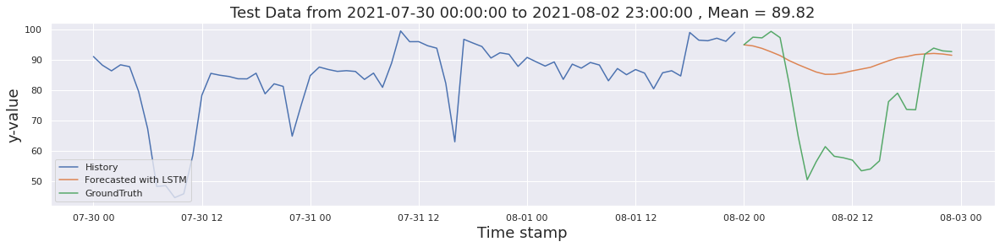

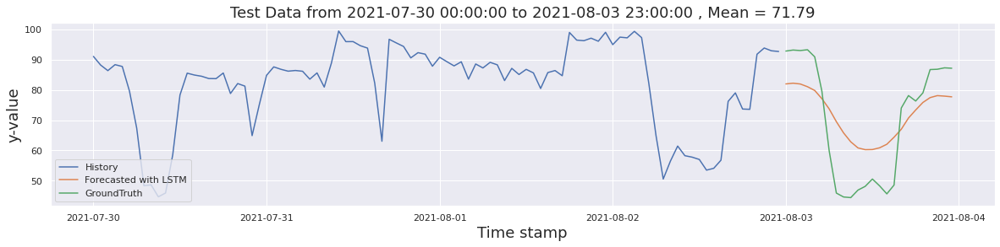

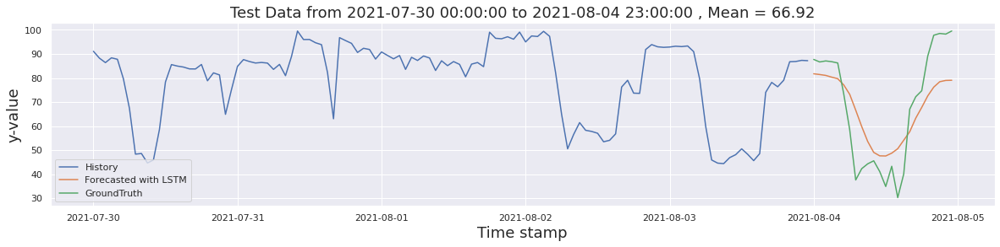

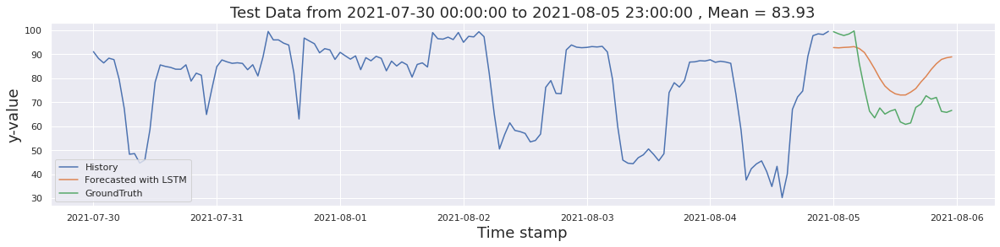

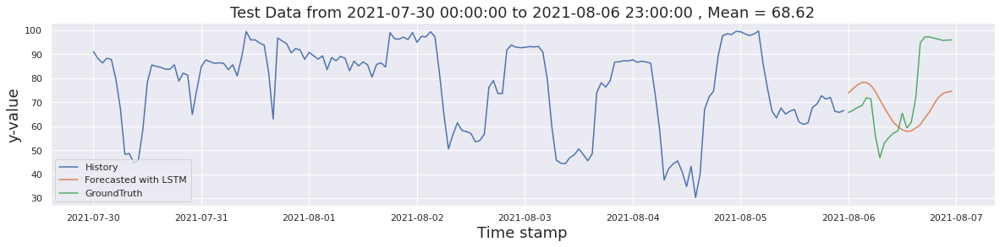

...

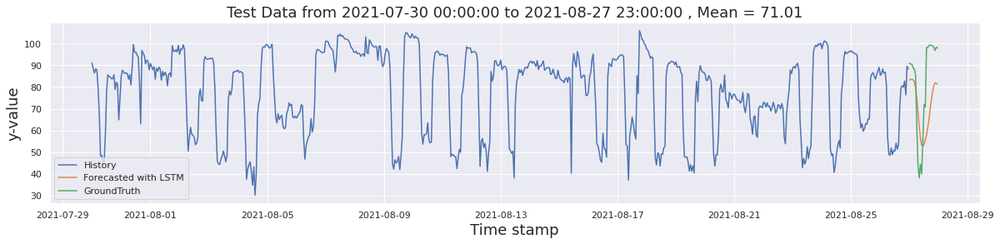

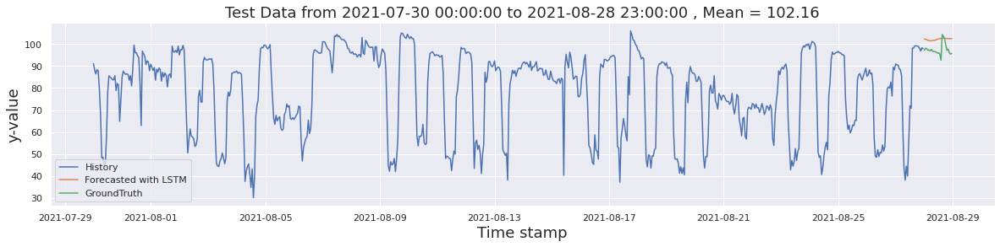

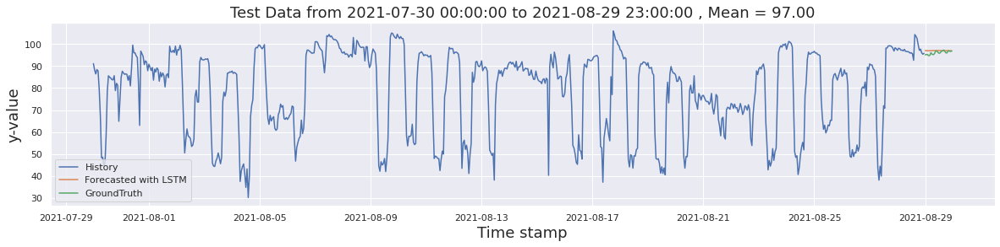

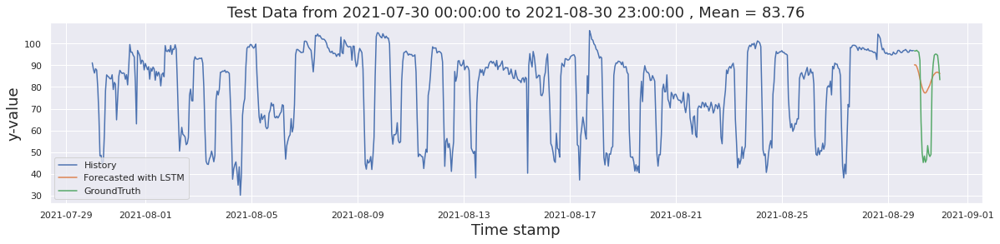

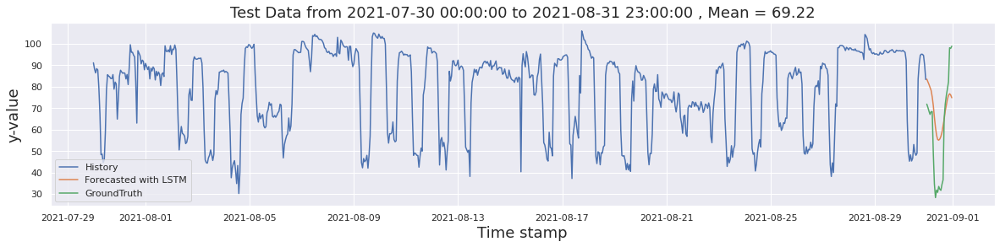

In [43]:
# all test batches

dfs2 = pd.DataFrame() # to save predictions
past = pd.DataFrame() # to save past data which is not used to evaluate metrics
error_metrics_2 = pd.DataFrame() # To save error metrics


for i in range(0,720,24):
    n_steps_in = 72
    n_steps_out = 24
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out
    
    # prepare data for time series sequence
    y_pred_inv , dataset_test_y , past_data = prep_data(test_scaled, y_test, start,
                                                        end, last, results2)
    # plot the sequence
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end)
    
    # calculate errors and then return dataframe
    errors = evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , dataset_test_y.index[0],
                                 dataset_test_y.index[-1])
    
    
    # concat with previour error data frames
    error_metrics_2 = pd.concat([error_metrics_2, errors], ignore_index=False)
    
    # save past data
    past = pd.DataFrame()
    past["past"] = past_data
    
    # concat with previour past data frames
    past = pd.concat([past], ignore_index=False)
    
    # create data to save multiple colums
    d = pd.DataFrame()
    d["Ground Truth"] = dataset_test_y
    d["Predictions"] = y_pred_inv
    
    # concat with outside dataframe to save all results
    dfs2 = pd.concat([dfs2, d], ignore_index=False)

# Now merge past and predictions dataframe on date column
all_data2 = past.merge(dfs2, right_index=True, left_index=True, how="outer")

In [44]:
all_data2.to_csv(os.path.join(forecast, "pm_lstm_h_1.csv"))

In [45]:
fig2 = px.line(all_data2, x=all_data2.index, y=["past", "Ground Truth", "Predictions"])
                                            
fig2.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=24, label='1 Day', step='hour', stepmode='backward'),
            dict(count=3*24, label='3 Day', step='hour', stepmode='backward'),
            dict(count=5*24, label='5 Day', step='hour', stepmode='backward'),
            dict(count=7*24, label='7 Day', step='hour', stepmode='backward'),
            dict(step='all')
            ])
    )
)

# Show plot 
fig2.show()

#fig2.write_html("model_hour_2.html")

In [46]:
# close all plots
plt.close('all')

In [47]:
error_metrics_2

,MSE,RMSE,MAE,R^2
2021-08-02 00:00:00 : 2021-08-02 23:00:00,420.647798,20.509700,16.181897,-0.400816
2021-08-03 00:00:00 : 2021-08-03 23:00:00,156.808834,12.522333,11.420869,0.579347
2021-08-04 00:00:00 : 2021-08-04 23:00:00,194.168493,13.934436,12.097078,0.653380
2021-08-05 00:00:00 : 2021-08-05 23:00:00,174.908661,13.225304,11.912289,0.038395
2021-08-06 00:00:00 : 2021-08-06 23:00:00,331.618620,18.210399,15.117403,-0.134940
2021-08-07 00:00:00 : 2021-08-07 23:00:00,17.918837,4.233065,3.414537,-0.059120
2021-08-08 00:00:00 : 2021-08-08 23:00:00,18.828962,4.339235,3.555680,-0.950266
2021-08-09 00:00:00 : 2021-08-09 23:00:00,918.829043,30.312193,22.907543,-0.420005
2021-08-10 00:00:00 : 2021-08-10 23:00:00,346.958167,18.626813,12.732577,0.104832
2021-08-11 00:00:00 : 2021-08-11 23:00:00,432.076599,20.786452,15.200425,0.079484


## Model 3: All Features with shifting features values to 25 hours in future

In [48]:
x1 = df.values
y = df["kw"].values

n_steps_in, past,  n_steps_out = 24, 3, 24

X, Y = prepare_time_series(x1, y, input_steps=n_steps_in,
                                    output_steps=n_steps_out, past=past,
                                   PCA=True)

X_train, y_train, x_test, y_test = train_test_split(X, Y)

dataset_stacked.shape (21168, 6)
X.shape (21074, 72, 5)
y.shape (21074, 24)
train_X.shape (18966, 72, 5)
train_y.shape (18966, 24)
test_X.shape (2108, 72, 5)
test_y.shape (2108, 24)
n_features 5


Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_28 (LSTM)               (None, 72, 50)            11200     
_________________________________________________________________
dropout_28 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_29 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dropout_29 (Dropout)         (None, 50)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 24)                1224      
Total params: 32,624
Trainable params: 32,624
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
176/176 [==============================] - 4s 11ms/step - loss: 0.0434 - root_mean_squared_error: 0.2084

176/176 [==============================] - 1s 8ms/step - loss: 0.0049 - root_mean_squared_error: 0.0701 - val_loss: 0.0421 - val_root_mean_squared_error: 0.2052
Epoch 43/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0049 - root_mean_squared_error: 0.0699 - val_loss: 0.0431 - val_root_mean_squared_error: 0.2075
Epoch 44/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0050 - root_mean_squared_error: 0.0704 - val_loss: 0.0421 - val_root_mean_squared_error: 0.2052
Epoch 45/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0050 - root_mean_squared_error: 0.0704 - val_loss: 0.0403 - val_root_mean_squared_error: 0.2007
Epoch 46/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0051 - root_mean_squared_error: 0.0712 - val_loss: 0.0416 - val_root_mean_squared_error: 0.2039
Epoch 47/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0048 - root_mean_squared_error: 0.0691 - val_loss: 0.0415 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0054 - root_mean_squared_error: 0.0735 - val_loss: 0.0409 - val_root_mean_squared_error: 0.2022
Epoch 34/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0053 - root_mean_squared_error: 0.0729 - val_loss: 0.0389 - val_root_mean_squared_error: 0.1973
Epoch 35/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0053 - root_mean_squared_error: 0.0728 - val_loss: 0.0407 - val_root_mean_squared_error: 0.2018
Epoch 36/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0054 - root_mean_squared_error: 0.0734 - val_loss: 0.0414 - val_root_mean_squared_error: 0.2036
Epoch 37/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0053 - root_mean_squared_error: 0.0727 - val_loss: 0.0392 - val_root_mean_squared_error: 0.1980
Epoch 38/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0052 - root_mean_squared_error: 0.0724 - val_loss: 0.0406 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0059 - root_mean_squared_error: 0.0766 - val_loss: 0.0401 - val_root_mean_squared_error: 0.2002
Epoch 25/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0059 - root_mean_squared_error: 0.0765 - val_loss: 0.0387 - val_root_mean_squared_error: 0.1968
Epoch 26/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0058 - root_mean_squared_error: 0.0763 - val_loss: 0.0417 - val_root_mean_squared_error: 0.2041
Epoch 27/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0057 - root_mean_squared_error: 0.0758 - val_loss: 0.0391 - val_root_mean_squared_error: 0.1977
Epoch 28/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0058 - root_mean_squared_error: 0.0759 - val_loss: 0.0371 - val_root_mean_squared_error: 0.1927
Epoch 29/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0069 - root_mean_squared_error: 0.0831 - val_loss: 0.0416 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0133 - root_mean_squared_error: 0.1155 - val_loss: 0.0445 - val_root_mean_squared_error: 0.2110
Epoch 16/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0129 - root_mean_squared_error: 0.1134 - val_loss: 0.0437 - val_root_mean_squared_error: 0.2090
Epoch 17/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0121 - root_mean_squared_error: 0.1098 - val_loss: 0.0454 - val_root_mean_squared_error: 0.2132
Epoch 18/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0116 - root_mean_squared_error: 0.1076 - val_loss: 0.0511 - val_root_mean_squared_error: 0.2261
Epoch 19/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0109 - root_mean_squared_error: 0.1043 - val_loss: 0.0422 - val_root_mean_squared_error: 0.2054
Epoch 20/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0105 - root_mean_squared_error: 0.1023 - val_loss: 0.0448 - val_root_m

176/176 [==============================] - 1s 8ms/step - loss: 0.0223 - root_mean_squared_error: 0.1493 - val_loss: 0.0361 - val_root_mean_squared_error: 0.1900
Epoch 7/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0203 - root_mean_squared_error: 0.1426 - val_loss: 0.0400 - val_root_mean_squared_error: 0.2000
Epoch 8/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0187 - root_mean_squared_error: 0.1368 - val_loss: 0.0440 - val_root_mean_squared_error: 0.2098
Epoch 9/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0172 - root_mean_squared_error: 0.1310 - val_loss: 0.0406 - val_root_mean_squared_error: 0.2016
Epoch 10/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0159 - root_mean_squared_error: 0.1260 - val_loss: 0.0394 - val_root_mean_squared_error: 0.1984
Epoch 11/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0149 - root_mean_squared_error: 0.1222 - val_loss: 0.0402 - val_root_mean

176/176 [==============================] - 4s 12ms/step - loss: 0.0697 - root_mean_squared_error: 0.2640 - val_loss: 0.0399 - val_root_mean_squared_error: 0.1998
Epoch 2/50
176/176 [==============================] - 2s 9ms/step - loss: 0.0387 - root_mean_squared_error: 0.1967 - val_loss: 0.0378 - val_root_mean_squared_error: 0.1943
Epoch 3/50
176/176 [==============================] - 2s 9ms/step - loss: 0.0325 - root_mean_squared_error: 0.1802 - val_loss: 0.0369 - val_root_mean_squared_error: 0.1920
Epoch 4/50
176/176 [==============================] - 2s 9ms/step - loss: 0.0283 - root_mean_squared_error: 0.1681 - val_loss: 0.0397 - val_root_mean_squared_error: 0.1991
Epoch 5/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0248 - root_mean_squared_error: 0.1575 - val_loss: 0.0423 - val_root_mean_squared_error: 0.2057
Epoch 6/50
176/176 [==============================] - 2s 9ms/step - loss: 0.0228 - root_mean_squared_error: 0.1509 - val_loss: 0.0408 - val_root_mean_

176/176 [==============================] - 1s 8ms/step - loss: 0.0061 - root_mean_squared_error: 0.0784 - val_loss: 0.0382 - val_root_mean_squared_error: 0.1953
Epoch 49/50
176/176 [==============================] - 2s 9ms/step - loss: 0.0061 - root_mean_squared_error: 0.0783 - val_loss: 0.0369 - val_root_mean_squared_error: 0.1921
Epoch 50/50
176/176 [==============================] - 1s 8ms/step - loss: 0.0062 - root_mean_squared_error: 0.0784 - val_loss: 0.0386 - val_root_mean_squared_error: 0.1966
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_40 (LSTM)               (None, 72, 50)            11200     
_________________________________________________________________
dropout_40 (Dropout)         (None, 72, 50)            0         
_________________________________________________________________
lstm_41 (LSTM)               (None, 50)                20200     
________

264/264 [==============================] - 2s 8ms/step - loss: 0.0052 - root_mean_squared_error: 0.0723 - val_loss: 0.0399 - val_root_mean_squared_error: 0.1998
Epoch 40/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0058 - root_mean_squared_error: 0.0761 - val_loss: 0.0426 - val_root_mean_squared_error: 0.2065
Epoch 41/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0053 - root_mean_squared_error: 0.0727 - val_loss: 0.0402 - val_root_mean_squared_error: 0.2005
Epoch 42/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0052 - root_mean_squared_error: 0.0719 - val_loss: 0.0401 - val_root_mean_squared_error: 0.2002
Epoch 43/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0051 - root_mean_squared_error: 0.0715 - val_loss: 0.0402 - val_root_mean_squared_error: 0.2005
Epoch 44/50
264/264 [==============================] - 2s 8ms/step - loss: 0.0051 - root_mean_squared_error: 0.0715 - val_loss: 0.0376 - val_root_m

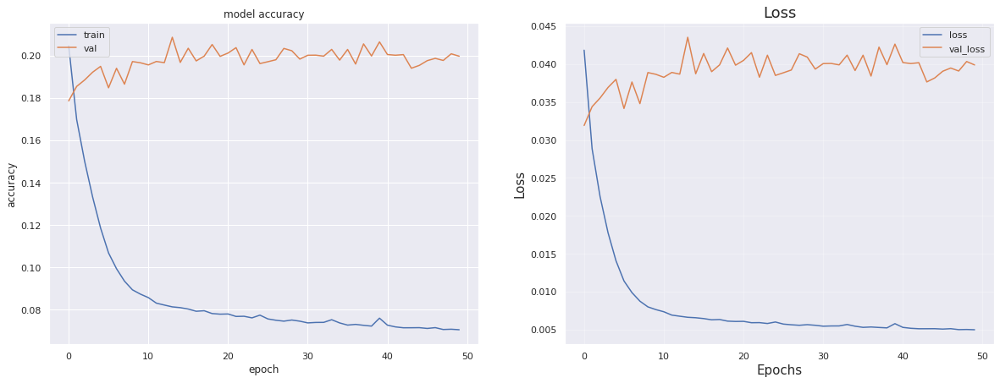

In [49]:
results3 = cross_validation(X_train, y_train, x_test, y_test)

In [50]:
# prepare test data

x_test = test_df
y_test = test_df['kw']


scaler = MinMaxScaler(feature_range=(0, 1))

test_ = scaler.fit_transform(x_test.values)
pca = decomposition.PCA(n_components=5)
test_scaled = pca.fit_transform(test_)

Test Data from 2021-08-02 00:00:00 to 2021-08-02 23:00:00
Mean Square Error: 198.35
Mean Absolute Error: 13.00
Root Mean Square Error: 14.08
R-Square: 0.34


Test Data from 2021-08-03 00:00:00 to 2021-08-03 23:00:00
Mean Square Error: 253.62
Mean Absolute Error: 15.38
Root Mean Square Error: 15.93
R-Square: 0.32


Test Data from 2021-08-04 00:00:00 to 2021-08-04 23:00:00
Mean Square Error: 472.40
Mean Absolute Error: 20.13
Root Mean Square Error: 21.73
R-Square: 0.16


Test Data from 2021-08-05 00:00:00 to 2021-08-05 23:00:00
Mean Square Error: 264.19
Mean Absolute Error: 15.44
Root Mean Square Error: 16.25
R-Square: -0.45


Test Data from 2021-08-06 00:00:00 to 2021-08-06 23:00:00
Mean Square Error: 247.18
Mean Absolute Error: 13.67
Root Mean Square Error: 15.72
R-Square: 0.15


Test Data from 2021-08-07 00:00:00 to 2021-08-07 23:00:00
Mean Square Error: 27.00
Mean Absolute Error: 4.36
Root Mean Square Error: 5.20
R-Square: -0.60


Test Data from 2021-08-08 00:00:00 to 2021-08-08 23:0

/tmp/ipykernel_1630/1491488613.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Test Data from 2021-08-23 00:00:00 to 2021-08-23 23:00:00
Mean Square Error: 773.37
Mean Absolute Error: 23.89
Root Mean Square Error: 27.81
R-Square: -0.60


Test Data from 2021-08-24 00:00:00 to 2021-08-24 23:00:00
Mean Square Error: 306.93
Mean Absolute Error: 16.38
Root Mean Square Error: 17.52
R-Square: 0.40


Test Data from 2021-08-25 00:00:00 to 2021-08-25 23:00:00
Mean Square Error: 152.89
Mean Absolute Error: 11.11
Root Mean Square Error: 12.36
R-Square: 0.16


Test Data from 2021-08-26 00:00:00 to 2021-08-26 23:00:00
Mean Square Error: 134.75
Mean Absolute Error: 9.52
Root Mean Square Error: 11.61
R-Square: 0.48


Test Data from 2021-08-27 00:00:00 to 2021-08-27 23:00:00
Mean Square Error: 463.79
Mean Absolute Error: 16.38
Root Mean Square Error: 21.54
R-Square: -0.02


Test Data from 2021-08-28 00:00:00 to 2021-08-28 23:00:00
Mean Square Error: 25.44
Mean Absolute Error: 4.79
Root Mean Square Error: 5.04
R-Square: -2.85


Test Data from 2021-08-29 00:00:00 to 2021-08-29 23:0

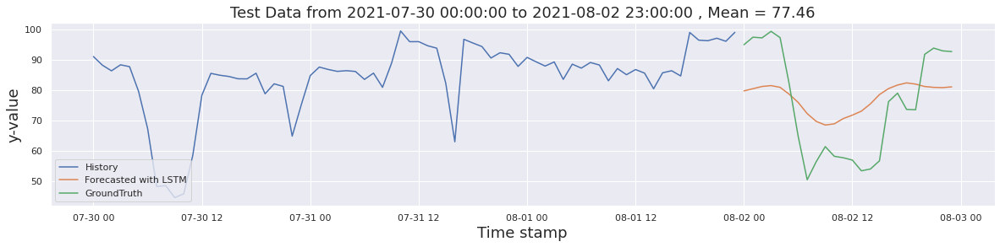

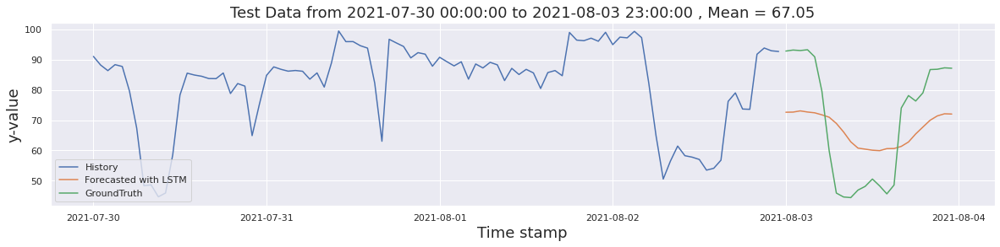

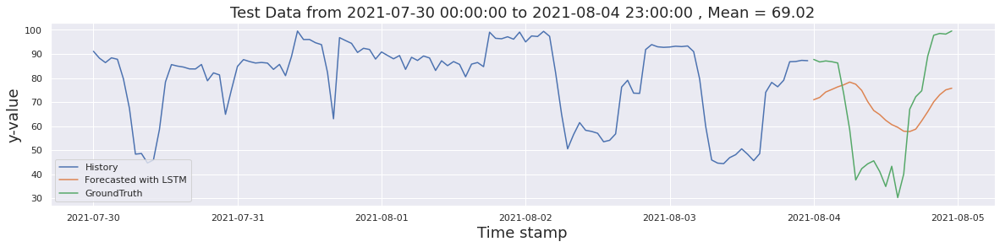

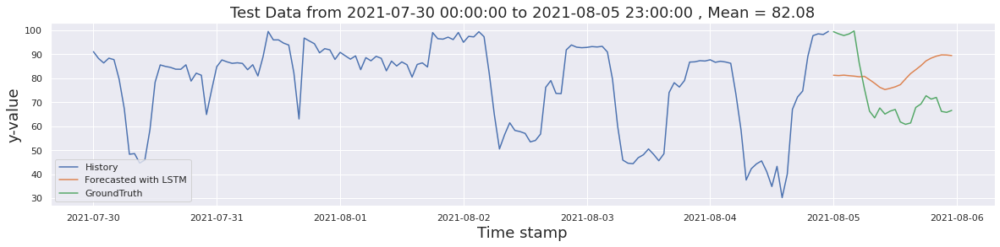

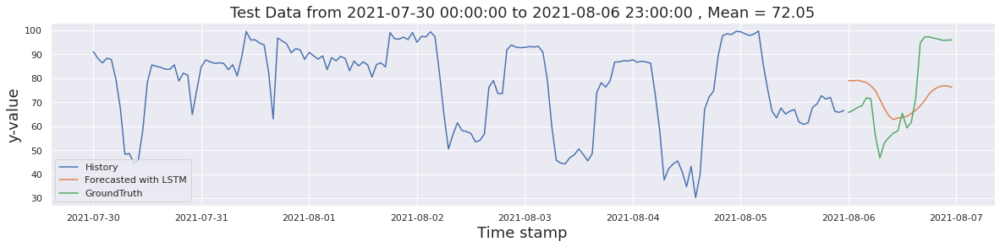

...

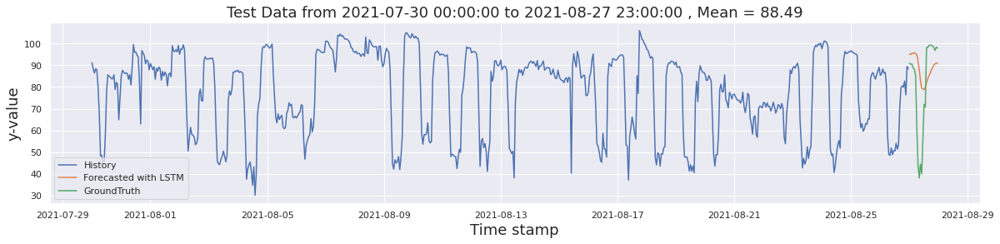

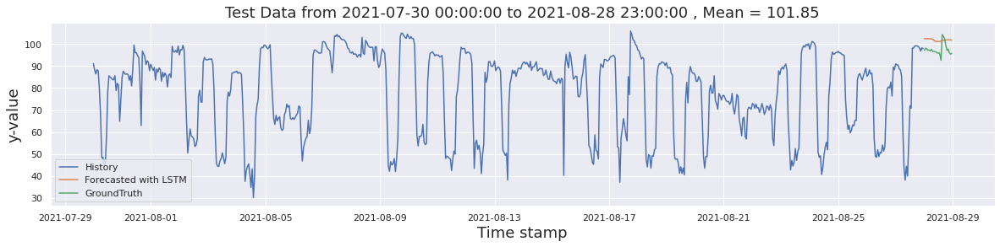

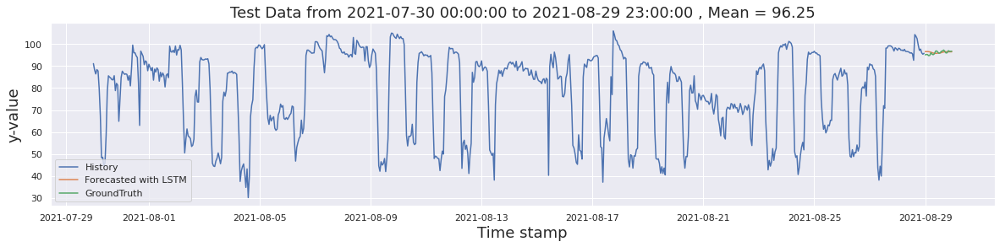

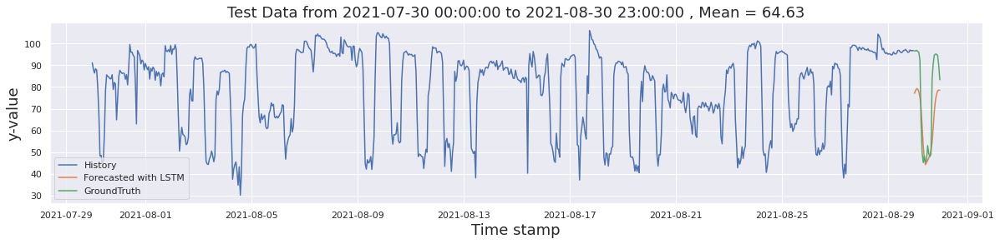

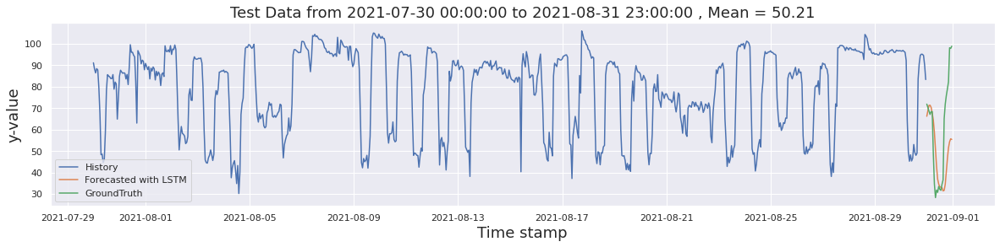

In [51]:
# all test batches

dfs3 = pd.DataFrame() # to save predictions
past = pd.DataFrame() # to save past data which is not used to evaluate metrics
error_metrics_3 = pd.DataFrame() # To save error metrics


for i in range(0,720,24):
    n_steps_in = 72
    n_steps_out = 24
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out
    
    # prepare data for time series sequence
    y_pred_inv , dataset_test_y , past_data = prep_data(test_scaled, y_test, start,
                                                        end, last, results3)
    # plot the sequence
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end)
    
    # calculate errors and then return dataframe
    errors = evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , dataset_test_y.index[0],
                                 dataset_test_y.index[-1])
    
    
    # concat with previour error data frames
    error_metrics_3 = pd.concat([error_metrics_3, errors], ignore_index=False)
    
    # save past data
    past = pd.DataFrame()
    past["past"] = past_data
    
    # concat with previour past data frames
    past = pd.concat([past], ignore_index=False)
    
    # create data to save multiple colums
    d = pd.DataFrame()
    d["Ground Truth"] = dataset_test_y
    d["Predictions"] = y_pred_inv
    
    # concat with outside dataframe to save all results
    dfs3 = pd.concat([dfs3, d], ignore_index=False)

# Now merge past and predictions dataframe on date column
all_data3 = past.merge(dfs3, right_index=True, left_index=True, how="outer") 

In [52]:
all_data3.to_csv(os.path.join(forecast, "pm_lstm_h_3.csv"))

In [53]:
fig3 = px.line(all_data3, x=all_data2.index, y=["past", "Ground Truth", "Predictions"])
                                            
fig3.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=24, label='1 Day', step='hour', stepmode='backward'),
            dict(count=3*24, label='3 Day', step='hour', stepmode='backward'),
            dict(count=5*24, label='5 Day', step='hour', stepmode='backward'),
            dict(count=7*24, label='7 Day', step='hour', stepmode='backward'),
            dict(step='all')
            ])
    )
)

# Show plot 
fig2.show()
# write html
#fig3.write_html("model_hour_3.html")

In [54]:
error_metrics_3

,MSE,RMSE,MAE,R^2
2021-08-02 00:00:00 : 2021-08-02 23:00:00,198.353675,14.083809,13.002183,0.339454
2021-08-03 00:00:00 : 2021-08-03 23:00:00,253.620868,15.925479,15.382207,0.319640
2021-08-04 00:00:00 : 2021-08-04 23:00:00,472.402243,21.734816,20.126365,0.156691
2021-08-05 00:00:00 : 2021-08-05 23:00:00,264.194043,16.254047,15.437572,-0.452474
2021-08-06 00:00:00 : 2021-08-06 23:00:00,247.179963,15.721958,13.674116,0.154045
2021-08-07 00:00:00 : 2021-08-07 23:00:00,26.996991,5.195863,4.363266,-0.595698
2021-08-08 00:00:00 : 2021-08-08 23:00:00,13.901953,3.728532,2.870488,-0.439937
2021-08-09 00:00:00 : 2021-08-09 23:00:00,767.654276,27.706575,21.940975,-0.186372
2021-08-10 00:00:00 : 2021-08-10 23:00:00,460.475822,21.458700,18.848356,-0.188049
2021-08-11 00:00:00 : 2021-08-11 23:00:00,483.083011,21.979149,19.115311,-0.029182


In [55]:
from ipylab import JupyterFrontEnd

app = JupyterFrontEnd()
app.commands.execute('docmanager:save')